In [1]:
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import pickle
from matplotlib import style
import time
import collections
import random
import math

%matplotlib inline

In [2]:
import keras 

from keras.layers import Lambda, Input, Dense, LSTM, SimpleRNN, GRU
from keras.models import Model, Sequential
from keras.optimizers import Adam, SGD
from keras.datasets import mnist
from keras.losses import mse, binary_crossentropy, categorical_crossentropy
from keras.utils import plot_model
from keras import backend as K
from keras.regularizers import l1, l2
from keras.utils import np_utils, plot_model
from keras.layers import concatenate
from keras.layers.core import Reshape


import pydot
import tensorflow as tf
import os

Using TensorFlow backend.


In [3]:
from keras import backend as K
K.tensorflow_backend._get_available_gpus()

[]

In [4]:
class One_Talking_No_Time_Best_World():

    # Enumeration of possible actions
    class Actions():
        silence = 0
        a = 1
        b = 2
        c = 3
        nothing = 4
        choose_1 = 5
        choose_2 = 6
        choose_3 = 7 #etc
        # choose entity - entity number (the range(num of entities))

    def __init__(
        self, num_ent, winning_reward, talking_reward = 0): #choose true or false

        # Action enumeration for this environment
        #d = {1:"a",2:"b",3:"c"}
        #for i in range(num_ent):
        #    d[i+4] = str(i+1)
        #self.actions = d
        self.num_ent = num_ent
        self.winning_reward = winning_reward
        self.talking_reward = talking_reward
        self.talking_decay = 0.995
        self.actions1 = collections.deque(maxlen=100)
        self.actions2 = collections.deque(maxlen=100)
                
    def step(self, ag1_action, ag2_action, choose, reward1 = 0, reward2 = 0):
        ag1_input = np.array([np.random.random()]) #UNIFORM/bimodal NOISE
        ag2_input = np.random.normal(0,0.01,(4,)) * 0 #talking binary (3) + noise
                
        if choose: # step of choice
            self.actions1.append(ag1_action)
            self.actions2.append(ag2_action)
            a1_rew = 0
            a2_rew = 0
            
            if len(self.actions1) > 99:
                a1_rew = ((1/self.num_ent) - self.actions1.count(ag1_action)/100) * 2
                a2_rew = ((1/self.num_ent) - self.actions2.count(ag2_action)/100) * 2
                if a1_rew > 0:
                  a1_rew = 0
                if a2_rew > 0:
                  a2_rew = 0
                
            if ag2_action == ag1_action: 
                reward1 = self.winning_reward + a1_rew
                reward2 = self.winning_reward + a2_rew
                
            else:
                reward1 = 0#a1_rew#-1
                reward2 = 0#a2_rew#-1
                    
        else: # agent 1 talking 
            if ag1_action == 1:
                ag2_input[0] += 1
                reward1 = self.talking_reward # * 0.995
            elif ag1_action == 2:
                ag2_input[1] += 1
                reward1 = self.talking_reward # * 0.995
            elif ag1_action == 3:
                ag2_input[2] += 1
                reward1 = self.talking_reward # * 0.995
        
        return(ag1_input, ag2_input, reward1, reward2)

In [5]:
# Deep Q-learning Agent
class DQNAgent_2_fake_teacher:
    def __init__(self, state_size, talking_action_size, choices):
        self.state_size = state_size
        self.memory = collections.deque(maxlen=11)
        self.gamma = 0.95    # discount rate
        self.epsilon = 1.0  # exploration rate
        self.epsilon_min = 0.3
        self.epsilon_decay = 0.999
        self.learning_rate_bad = 0.0001
        self.learning_rate_good = 0.01
 
        self.talking_action_size = talking_action_size
        self.choices = choices
        self.model = self._build_model()
 
    def _build_model(self):
        # Neural Net for Deep-Q learning Model
        t = 0
        model = Sequential()
        model.add(Dense(3, input_dim=self.state_size, activation='relu'))
        model.add(Dense(3, activation='relu'))
        if self.talking_action_size > 0:
            t = 1 # nothing for talking
        model.add(Dense(self.talking_action_size + t + self.choices + 1, activation='linear'))
        model.compile(loss='mse',
                      optimizer=SGD(lr=self.learning_rate_bad))
        return model
   
    def remember(self, state, action, reward, next_state):
        self.memory.append((state, action, reward, next_state))
                           
    def act(self, state):
       
        assert self.choices == self.talking_action_size, "Fake agent assumes equal sizes of communication and action spaces"
 
        choice = random.randrange(self.choices + 1)
 
        return [choice, choice] # Todo - if different sizes of blah
                           
    def replay(self, batch_size):
        minibatch = random.sample(self.memory, batch_size)
        for state, action, reward, next_state in minibatch:
            next_state = np.expand_dims(next_state, axis=0)
            state = np.expand_dims(state, axis=0)
            target = reward
            if target > 2: # won the game
                K.set_value(self.model.optimizer.lr, self.learning_rate_good)
            else:
                K.set_value(self.model.optimizer.lr, self.learning_rate_bad)
            if self.talking_action_size == 0:
            #if not done:
            #    target = reward + self.gamma * np.amax(self.model.predict(next_state, batch_size=1)[0])
                target_f = self.model.predict(state, batch_size=1)
                target_f[0][action] = target
                self.model.fit(state, target_f, batch_size=1, epochs=1, verbose=0)
            else:
                target_f = self.model.predict(state, batch_size=1)
                target_f[0][action[0]] = target # talk
                target_f[0][action[1]+self.talking_action_size+1] = target # choose
                self.model.fit(state, target_f, batch_size=1, epochs=1, verbose=0)
 
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
 
 
# Deep Q-learning Agent
class DQNAgent_2_fake_student:
    def __init__(self, state_size, talking_action_size, choices):
        self.state_size = state_size
        self.memory = collections.deque(maxlen=100)
        self.gamma = 0.95    # discount rate
        self.epsilon = 1.0  # exploration rate
        self.epsilon_min = 0.3
        self.epsilon_decay = 0.999
        self.learning_rate_bad = 0.0001
        self.learning_rate_good = 0.01
 
        self.talking_action_size = talking_action_size
        self.choices = choices
        self.model = self._build_model()
 
    def _build_model(self):
        # Neural Net for Deep-Q learning Model
        t = 0
        model = Sequential()
        model.add(Dense(3, input_dim=self.state_size, activation='relu'))
        model.add(Dense(3, activation='relu'))
        if self.talking_action_size > 0:
            t = 1 # nothing for talking
        model.add(Dense(self.talking_action_size + t + self.choices + 1, activation='linear'))
        model.compile(loss='mse',
                      optimizer=Adam(lr=self.learning_rate_bad))
        return model
   
    def remember(self, state, action, reward, next_state):
        self.memory.append((state, action, reward, next_state))
                           
    def act(self, state):
       
        #assert self.choices == self.talking_action_size, "Fake agent assumes equal sizes of communication and action spaces"
 
        if np.all(state < 0.5):
          return self.choices
 
        choice = np.argmax(state)
 
        return choice # Todo - if different sizes of blah
                           
    def replay(self, batch_size):
        minibatch = random.sample(self.memory, batch_size)
        for state, action, reward, next_state in minibatch:
            next_state = np.expand_dims(next_state, axis=0)
            state = np.expand_dims(state, axis=0)
            target = reward
            if target > 2: # won the game
                K.set_value(self.model.optimizer.lr, self.learning_rate_good)
            else:
                K.set_value(self.model.optimizer.lr, self.learning_rate_bad)
            if self.talking_action_size == 0:
            #if not done:
            #    target = reward + self.gamma * np.amax(self.model.predict(next_state, batch_size=1)[0])
                target_f = self.model.predict(state, batch_size=1)
                target_f[0][action] = target
                self.model.fit(state, target_f, batch_size=1, epochs=1, verbose=0)
            else:
                target_f = self.model.predict(state, batch_size=1)
                target_f[0][action[0]] = target # talk
                target_f[0][action[1]+self.talking_action_size+1] = target # choose
                self.model.fit(state, target_f, batch_size=1, epochs=1, verbose=0)
 
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

In [6]:
class DQNAgent_2_new:
    def __init__(self, state_size, talking_action_size, choices):
        self.state_size = state_size
        self.memory = collections.deque(maxlen=25)
        self.gamma = 0.95    # discount rate
        self.epsilon = 1.0  # exploration rate
        self.epsilon_min = 0.05
        self.epsilon_decay = 0.999
        self.learning_rate_bad = 0.00001
        self.learning_rate_good = 0.00001
 
        self.talking_action_size = talking_action_size
        self.choices = choices
        self.model = self._build_model()
 
 
    def _build_model_teacher(self):
        # Neural Net for Deep-Q learning Model
        assert self.talking_action_size > 0, "Zero talking for teacher"
        t = 1
       
        model = Sequential()
        model.add(Dense(15, input_dim=self.state_size + self.talking_action_size + 1, activation='relu'))
        model.add(Dense(15, activation='relu'))
 
        model.add(Dense(self.choices + 1, activation='linear'))
        model.compile(loss='mse',
                      optimizer=Adam(lr=self.learning_rate_bad))
        return model
     
    def _build_model_student(self):
        # Neural Net for Deep-Q learning Model
 
        assert self.talking_action_size == 0, "Student model called with nonzero talking action size"
 
        model = Sequential()
        model.add(Dense(15, input_dim=self.state_size, activation='relu'))
        model.add(Dense(15, activation='relu'))
       
        model.add(Dense(self.choices + 1, activation='linear'))
        model.compile(loss='mse',
                      optimizer=Adam(lr=self.learning_rate_bad))
        return model
 
    def _build_model(self):
        # Neural Net for Deep-Q learning Model
       
        if self.talking_action_size > 0:
            return self._build_model_teacher()
        else:
            return self._build_model_student()
       
   
    def remember(self, state, action, reward, next_state):
        self.memory.append((state, action, reward, next_state))
                           
    def act(self, state):
 
        ### Exploration
        if np.random.rand() <= self.epsilon:
            if self.talking_action_size == 0:
                return random.randrange(self.choices+1)
            else:
                return [random.randrange(self.talking_action_size+1), random.randrange(self.choices+1)]
 
        ### Acting for student
        if self.talking_action_size == 0:
         
            state = np.expand_dims(state, axis=0)
            act_values = self.model.predict(state, batch_size=1)
 
            return np.argmax(act_values[0])  # returns choice from 0 to n-1
 
 
        # Acting for teacher
        else:
 
          max_q = -float("infinity")
          max_talk = None
          max_action = None
 
          for i in range(self.talking_action_size + 1):
 
            talking = np.zeros(self.talking_action_size + 1)
            talking[i] = 1
 
            state_cur = np.expand_dims(np.hstack([state, talking]), axis=0)
 
            act_values = self.model.predict(state_cur, batch_size=1)
 
            cur_max = np.max(act_values)
           
            if cur_max > max_q:
 
              max_q = cur_max
              max_action = np.argmax(act_values[0])
              max_talk = i
 
          assert max_talk is not None
          assert max_action is not None
 
          return [max_talk, max_action]
                           
    def replay(self, batch_size):
        minibatch = random.sample(self.memory, batch_size)
        for state, action, reward, next_state in minibatch:
            next_state = np.expand_dims(next_state, axis=0)
            state = np.expand_dims(state, axis=0)
            target = reward
            #if target > 2: # won the game
            #    K.set_value(self.model.optimizer.lr, self.learning_rate_good)
            #else:
            #    K.set_value(self.model.optimizer.lr, self.learning_rate_bad)
            if self.talking_action_size == 0:
            #if not done:
            #    target = reward + self.gamma * np.amax(self.model.predict(next_state, batch_size=1)[0])
                target_f = self.model.predict(state, batch_size=1)
                target_f[0][action] = target
                self.model.train_on_batch(state, target_f)
            else:
                one_hot_talk = np.zeros(self.talking_action_size + 1)
                one_hot_talk[action[0]] = 1
                cur_state = np.hstack([state, one_hot_talk[np.newaxis]])
 
                target_f = self.model.predict(cur_state, batch_size=1)
                #target_f[0][action[0]] = target # talk
                target_f[0][action[1]] = target # choose
                self.model.train_on_batch(cur_state, target_f)
 
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

In [0]:
agent1 = DQNAgent_2_new(1, 3, 3) # can talk
agent2 = DQNAgent_2_new(4, 0, 3)

In [0]:
env = One_Talking_No_Time_Best_World(4, 1, 0)

episode: 0/2500, score1: 0.52, score2: 0.5
episode: 1/2500, score1: 0.5, score2: 0.48
episode: 2/2500, score1: 0.48, score2: 0.45999999999999996
episode: 3/2500, score1: 0.45999999999999996, score2: 0.43999999999999995
episode: 4/2500, score1: 0.43999999999999995, score2: 0.41999999999999993
episode: 5/2500, score1: 0.41999999999999993, score2: 0.41999999999999993
episode: 6/2500, score1: 0.3999999999999999, score2: 0.3999999999999999
episode: 7/2500, score1: 0.3799999999999999, score2: 0.3799999999999999
episode: 8/2500, score1: 0.3600000000000001, score2: 0.3600000000000001
episode: 9/2500, score1: 0.3600000000000001, score2: 0.3600000000000001
episode: 10/2500, score1: 0.3400000000000001, score2: 0.3400000000000001
episode: 11/2500, score1: 0.32000000000000006, score2: 0.32000000000000006
episode: 12/2500, score1: 0.30000000000000004, score2: 0.30000000000000004
episode: 13/2500, score1: 0.28, score2: 0.28
episode: 14/2500, score1: 0.26, score2: 0.26
episode: 15/2500, score1: 0.24, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:69: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

episode: 1000/2500, score1: 0, score2: 0
episode: 1001/2500, score1: -0.06000000000000005, score2: 0.08000000000000007
episode: 1002/2500, score1: -0.08000000000000007, score2: 0.08000000000000007
episode: 1003/2500, score1: -0.10000000000000009, score2: 0.06000000000000005
episode: 1004/2500, score1: -0.1200000000000001, score2: 0.040000000000000036
episode: 1005/2500, score1: 1, score2: 1
episode: 1006/2500, score1: -0.1399999999999999, score2: 0.020000000000000018
episode: 1007/2500, score1: 0, score2: 0
episode: 1008/2500, score1: -0.1200000000000001, score2: 0.020000000000000018
episode: 1009/2500, score1: -0.1399999999999999, score2: 0.0
episode: 1010/2500, score1: -0.1399999999999999, score2: 0.0
episode: 1011/2500, score1: -0.15999999999999992, score2: -0.020000000000000018
episode: 1012/2500, score1: -0.17999999999999994, score2: -0.040000000000000036
episode: 1013/2500, score1: -0.19999999999999996, score2: -0.06000000000000005
episode: 1014/2500, score1: -0.21999999999999997

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

episode: 1500/2500, score1: 0.3799999999999999, score2: 0.3999999999999999
episode: 1501/2500, score1: 0.3600000000000001, score2: 0.3799999999999999
episode: 1502/2500, score1: 0.3400000000000001, score2: 0.3600000000000001
episode: 1503/2500, score1: 0.32000000000000006, score2: 0.3400000000000001
episode: 1504/2500, score1: 0.30000000000000004, score2: 0.32000000000000006
episode: 1505/2500, score1: 0.28, score2: 0.30000000000000004
episode: 1506/2500, score1: 0.26, score2: 0.28
episode: 1507/2500, score1: 0.24, score2: 0.26
episode: 1508/2500, score1: 1, score2: 1
episode: 1509/2500, score1: 0.21999999999999997, score2: 0.24
episode: 1510/2500, score1: 0.19999999999999996, score2: 0.21999999999999997
episode: 1511/2500, score1: 1, score2: 1
episode: 1512/2500, score1: 0.17999999999999994, score2: 0.19999999999999996
episode: 1513/2500, score1: 0.15999999999999992, score2: 0.17999999999999994
episode: 1514/2500, score1: 0.1399999999999999, score2: 0.15999999999999992
episode: 1515/2

<Figure size 432x288 with 0 Axes>

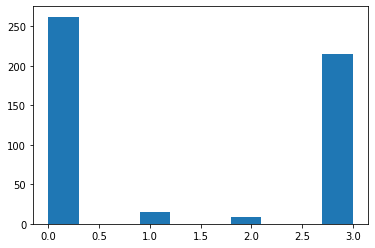

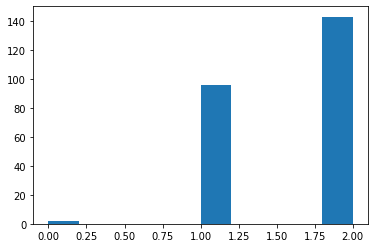

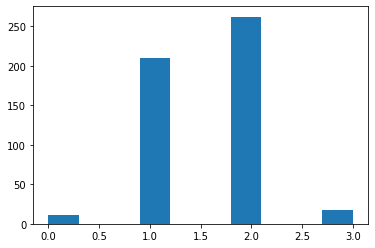

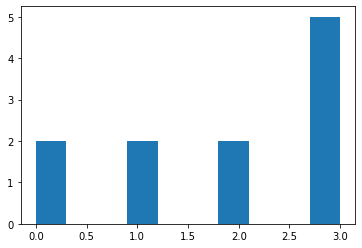

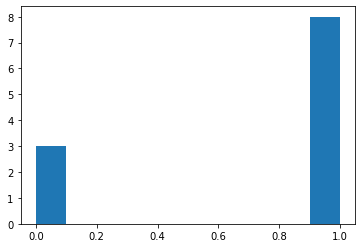

...

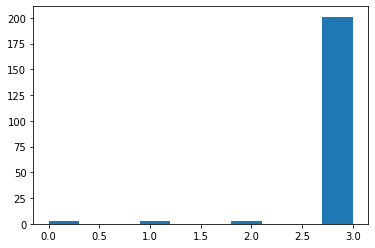

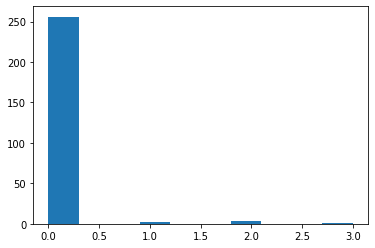

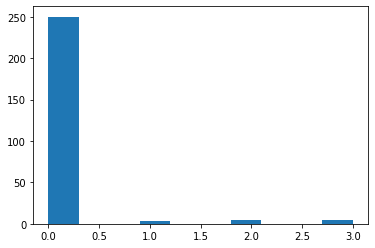

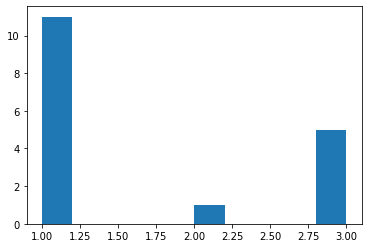

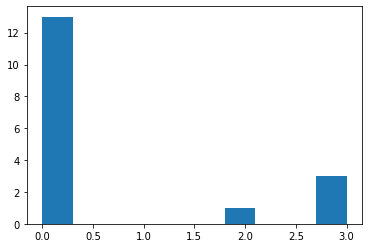

<Figure size 432x288 with 0 Axes>

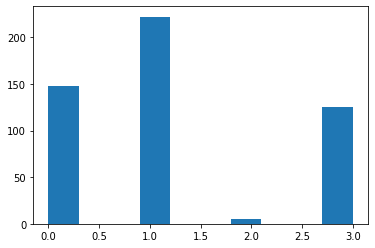

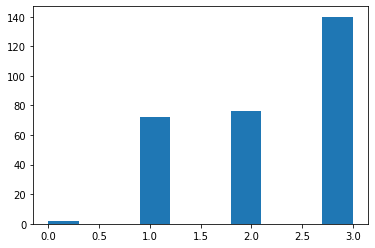

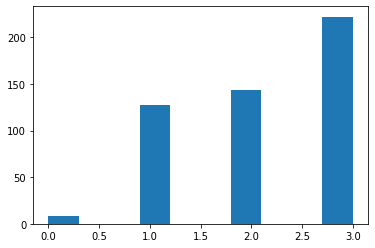

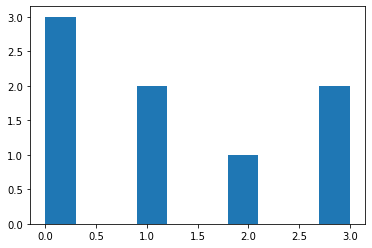

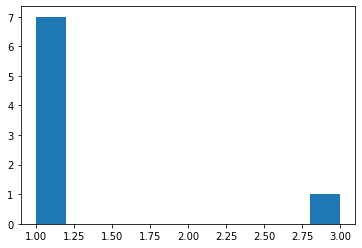

...

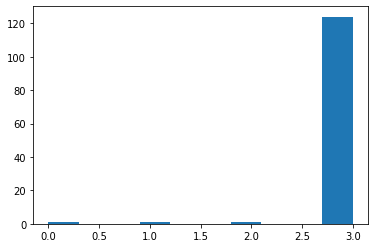

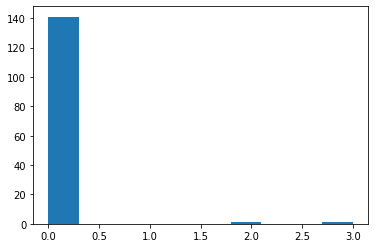

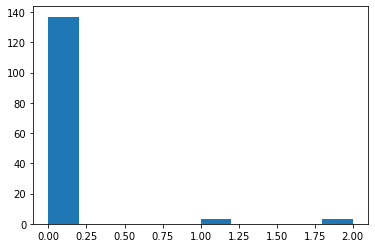

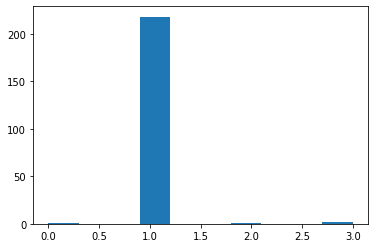

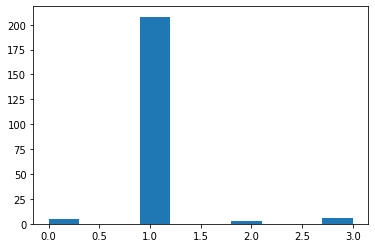

<Figure size 432x288 with 0 Axes>

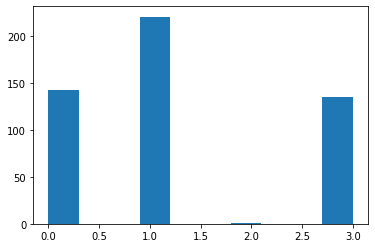

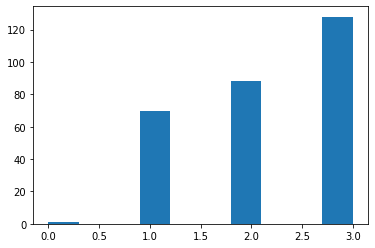

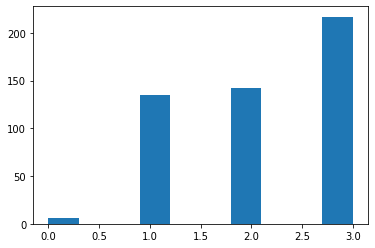

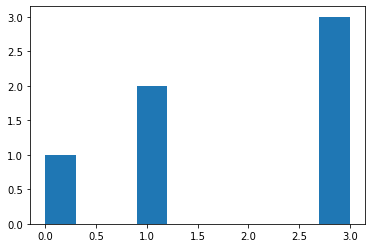

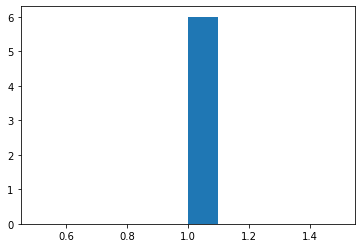

...

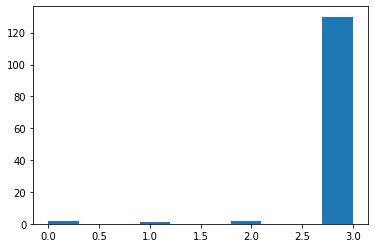

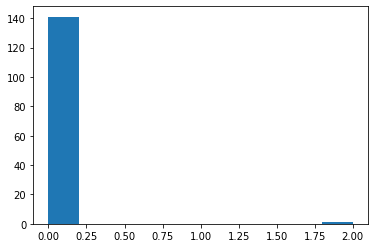

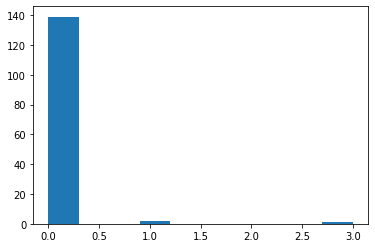

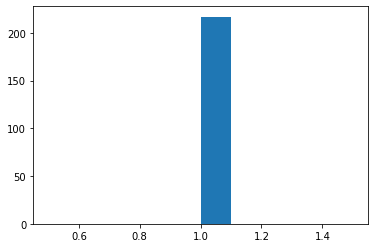

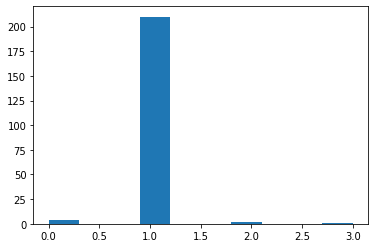

<Figure size 432x288 with 0 Axes>

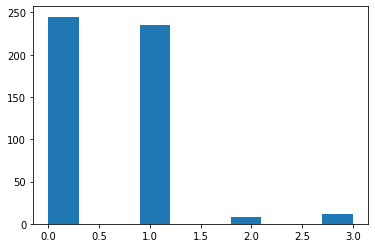

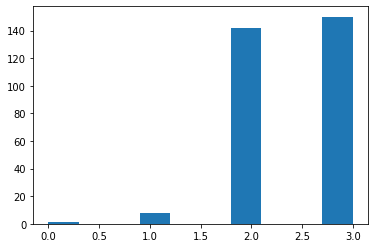

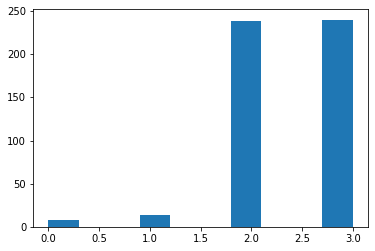

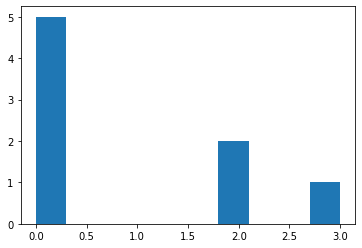

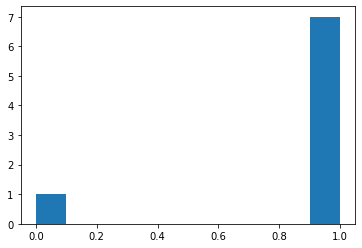

...

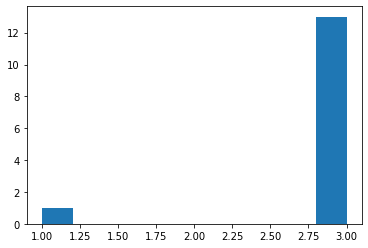

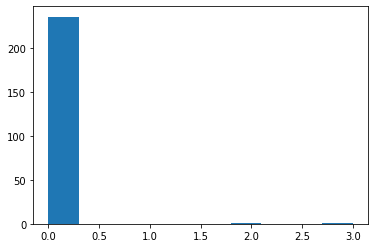

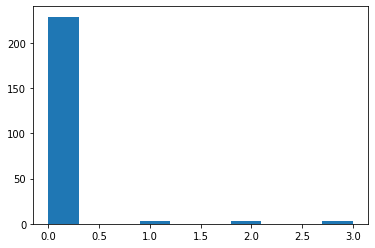

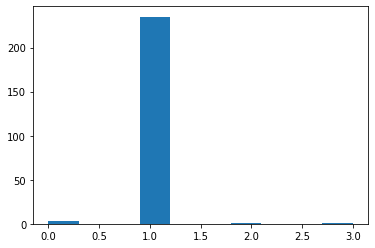

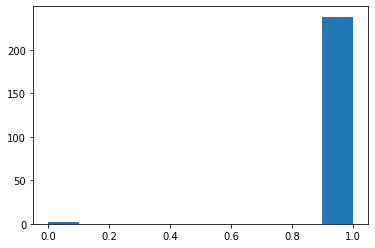

In [103]:
# Iterate the game
episodes = 2500
a1_talk = []
a1_act = []
a2 = []
scores1 = []
scores2 = []

wins = 1
loses = 1

for e in range(episodes):
    score1 = 0
    score2 = 0
    
    state1, state2, _, _ = env.step(0, 0, 0) # 4 - doing nothing 
    
    # agent 1 talks
    action1 = agent1.act(state1)
    
    state1, state2, reward1, reward2 = env.step(action1[0], 4, 0)     
    score1 += reward1
    
    action2 = agent2.act(state2)
    
    # everyone chooses
    next_state1, next_state2, reward1, reward2 = env.step(action1[1], action2, 1)     
        
    score1 += reward1
    score2 += reward2
    #if e > 1000:
    #    if score1 > 0.5: #won the game
    #        agent1.epsilon_min = 0
    #    else:
    #        agent1.epsilon_min = 0.1
    #    if score2 > 0.5: #won the game
    #        agent2.epsilon_min = 0
    #    else:
    #        agent2.epsilon_min = 0.1
        
    # remembering weighted by the reward
    #if random.random() < (score1 + 2.2):
    agent2.remember(state2, action2, reward2, next_state2)
    agent1.remember(state1, action1, reward1, next_state1)

    if e > 0 and e % 500 == 0:
        scores1_arr = np.array(scores1[e-500:e])
        a1_talk_arr = np.array(a1_talk[e-500:e])
        a1_act_arr = np.array(a1_act[e-500:e])
        a2_arr = np.array(a2[e-500:e])
        plt.figure()
        plt.figure()
        plt.hist(a1_act_arr)
        plt.figure()
        plt.hist(a1_talk_arr[scores1_arr > 0])
        plt.figure()
        plt.hist(a1_talk_arr)
        plt.figure()
        plt.hist(a1_act_arr[:][a1_talk_arr[:] == 0])
        plt.figure()
        plt.hist(a2_arr[:][a1_talk_arr[:] == 0])
        plt.figure()
        plt.hist(a1_act_arr[:][a1_talk_arr[:] == 1])
        plt.figure()
        plt.hist(a2_arr[:][a1_talk_arr[:] == 1])
        plt.figure()
        plt.hist(a1_act_arr[:][a1_talk_arr[:] == 2])
        plt.figure()
        plt.hist(a2_arr[:][a1_talk_arr[:] == 2])
        plt.figure()
        plt.hist(a1_act_arr[:][a1_talk_arr[:] == 3])
        plt.figure()
        plt.hist(a2_arr[:][a1_talk_arr[:] == 3])
        
    
    print("episode: {}/{}, score1: {}, score2: {}"
                  .format(e, episodes, score1, score2))
    if len(agent1.memory) >= 15 and len(agent2.memory) >= 15: 
        #if wins/loses < np.random.uniform(0,2):   
        agent1.replay(15)
        agent2.replay(15)
    
    a1_talk.append(action1[0])
    a1_act.append(action1[1])
    a2.append(action2)
    scores1.append(score1)
    scores2.append(score2)

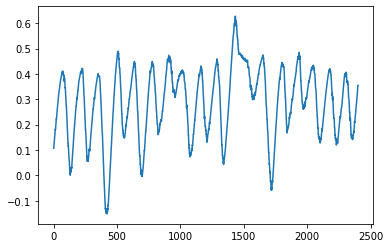

In [104]:
plt.plot(np.convolve(scores2, np.ones((100,))/100, mode='valid'))

### Agents can play both roles

In [7]:
class Two_Roles_Game():

    def __init__(
        self, num_choices, winning_reward, mean_sample, talking_action_size, punishment_weight = 2):
        self.num_choices = num_choices
        self.talking_action_size = talking_action_size
        self.winning_reward = winning_reward
        self.mean_sample = mean_sample
        self.actions1 = collections.deque(maxlen=mean_sample) # for mean calculations
        self.actions2 = collections.deque(maxlen=mean_sample) # for mean calculations
        self.mean_punishment_weight = punishment_weight
        self.who_talks = int(random.random()>0.5) # needs to be updated after each game
                
    def step(self, ag1_action, ag2_action, choose, reward1 = 0, reward2 = 0): #choose true or false
        #talker_input = np.zeros((self.talking_action_size+self.talking_action_size+1,)) # no noise
        #talker_input[1:self.talking_action_size+1] = np.random.random((self.talking_action_size,)) #UNIFORM/bimodal NOISE + signal for the game role
        talker_input = np.random.random((self.talking_action_size+1,)) #UNIFORM/bimodal NOISE + signal for the game role
        talker_input[0] = 1 # indicates that needs to talk
        #hearer_input = np.zeros((self.talking_action_size+self.talking_action_size+1,)) # no noise
        hearer_input = np.zeros((self.talking_action_size+1,))
        
        if choose: # step of choice
            self.actions1.append(ag1_action)
            self.actions2.append(ag2_action)
            a1_rew = 0
            a2_rew = 0
            
            if len(self.actions1) > self.mean_sample-1:
                a1_rew = ((1/self.num_choices) - self.actions1.count(ag1_action)/self.mean_sample) * self.mean_punishment_weight
                a2_rew = ((1/self.num_choices) - self.actions2.count(ag2_action)/self.mean_sample) * self.mean_punishment_weight
                if a1_rew>0:
                  a1_rew = 0
                if a2_rew>0:
                  a2_rew = 0
                
            if ag2_action == ag1_action: 
                reward1 = self.winning_reward + a1_rew
                reward2 = self.winning_reward + a2_rew
                
            else:
                reward1 = 0 #a1_rew #-1
                reward2 = 0 #a2_rew #-1
                    
        else: # agent is talking 
            if self.who_talks: #agent 1 - talker
                talker_action = ag1_action
            else:
                talker_action = ag2_action
            #hearer_input[self.talking_action_size + talker_action+1] = 1
            hearer_input[talker_action+1] = 1
            
        who_talks_now = self.who_talks
        if choose: 
            self.who_talks = int(random.random()>0.5) # 1 or 0 - for the new game
        
        if self.who_talks:
            return(talker_input, hearer_input, reward1, reward2, who_talks_now)
            #ag1_input = talker_input
            #ag2_input = hearer_input
        else:
            return(hearer_input, talker_input, reward1, reward2, who_talks_now)
            #ag2_input = talker_input
            #ag1_input = hearer_input
        
        #return(ag1_input, ag2_input, reward1, reward2, who_talks_now)

In [8]:
class DQNAgent_student_teacher:
    def __init__(self, talking_action_size, choices): 
        self.memory = collections.deque(maxlen=11)
        self.gamma = 0.95    # discount rate
        self.epsilon = 1.0  # exploration rate
        self.epsilon_min = 0.05
        self.epsilon_decay = 0.999
        self.learning_rate_bad = 0.0001
        self.learning_rate_good = 0.0001
        self.talking_action_size = talking_action_size
        self.choices = choices
        self.model = self._build_model_student_teacher()
 
 
    def _build_model_student_teacher(self):
        # Neural Net for Deep-Q learning Model
        
        model = Sequential()
        #model.add(Dense(25, input_dim=self.talking_action_size + self.talking_action_size +self.talking_action_size+ 1, activation='relu')) # one input - the game role
        model.add(Dense(25, input_dim=self.talking_action_size + self.talking_action_size+ 1, activation='relu')) # one input - the game role
        model.add(Dense(25, activation='softmax'))
        model.add(Dense(10, activation='relu'))
 
        model.add(Dense(self.choices, activation='linear'))
        model.compile(loss='mse',
                      optimizer=Adam(lr=self.learning_rate_bad))
        return model
       
   
    def remember(self, state, action, reward, next_state):
        self.memory.append((state, action, reward, next_state))
                           
    def act(self, state):
        if np.random.rand() <= self.epsilon:
            return [random.randrange(self.talking_action_size), random.randrange(self.choices)]
 
        
        max_q = -float("infinity")
        max_talk = None
        max_action = None
 
        for i in range(self.talking_action_size):
            talking = np.zeros(self.talking_action_size)
            talking[i] = 1
 
            state_cur = np.expand_dims(np.hstack([state, talking]), axis=0)
            act_values = self.model.predict(state_cur, batch_size=1)
 
            cur_max = np.max(act_values)
           
            if cur_max > max_q:
 
              max_q = cur_max
              max_action = np.argmax(act_values[0])
              max_talk = i
 
            assert max_talk is not None
            assert max_action is not None
 
        return [max_talk, max_action]
                           
    def replay(self, batch_size):
        for i in self.memory:
            minibatch = random.sample(self.memory, batch_size)
        for state, action, reward, next_state in minibatch:
            next_state = np.expand_dims(next_state, axis=0)
            #state = np.expand_dims(state, axis=0)
            target = reward
            one_hot_talk = np.zeros(self.talking_action_size)
            one_hot_talk[action[0]] = 1
            cur_state = np.expand_dims(np.hstack([state, one_hot_talk]), axis=0)
 
            target_f = self.model.predict(cur_state, batch_size=1)
            target_f[0][action[1]] = target # choose
            self.model.train_on_batch(cur_state, target_f)
 
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

In [0]:
num_choices = 4
num_talking_symbols = 4
winning_reward = 1
mean_sample = 100
punishment_weight = 2

agent1 = DQNAgent_student_teacher(num_talking_symbols, num_choices)
agent2 = DQNAgent_student_teacher(num_talking_symbols, num_choices) 
env = Two_Roles_Game(num_choices, winning_reward, mean_sample, num_talking_symbols, punishment_weight) 

episode: 0/5000, score1: 0, score2: 0
episode: 1/5000, score1: 0, score2: 0
episode: 2/5000, score1: 0, score2: 0
episode: 3/5000, score1: 1, score2: 1
episode: 4/5000, score1: 0, score2: 0
episode: 5/5000, score1: 1, score2: 1
episode: 6/5000, score1: 1, score2: 1
episode: 7/5000, score1: 0, score2: 0
episode: 8/5000, score1: 1, score2: 1
episode: 9/5000, score1: 0, score2: 0
episode: 10/5000, score1: 1, score2: 1
episode: 11/5000, score1: 0, score2: 0
episode: 12/5000, score1: 0, score2: 0
episode: 13/5000, score1: 0, score2: 0
episode: 14/5000, score1: 0, score2: 0
episode: 15/5000, score1: 0, score2: 0
episode: 16/5000, score1: 0, score2: 0
episode: 17/5000, score1: 0, score2: 0
episode: 18/5000, score1: 1, score2: 1
episode: 19/5000, score1: 0, score2: 0
episode: 20/5000, score1: 0, score2: 0
episode: 21/5000, score1: 0, score2: 0
episode: 22/5000, score1: 1, score2: 1
episode: 23/5000, score1: 0, score2: 0
episode: 24/5000, score1: 1, score2: 1
episode: 25/5000, score1: 0, score2

/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:75: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:77: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


episode: 1000/5000, score1: -0.08000000000000007, score2: 0.15999999999999992
episode: 1001/5000, score1: 0.18, score2: -0.8700000000000001
episode: 1002/5000, score1: -0.08000000000000007, score2: 0.09999999999999987
episode: 1003/5000, score1: -0.10999999999999988, score2: 0.06999999999999984
episode: 1004/5000, score1: 0.44999999999999996, score2: -0.9599999999999999
episode: 1005/5000, score1: 1.42, score2: 1.57
episode: 1006/5000, score1: -1.1400000000000001, score2: 0.44999999999999996
episode: 1007/5000, score1: -1.17, score2: 0.42000000000000004
episode: 1008/5000, score1: -0.20000000000000018, score2: 0.01000000000000012
episode: 1009/5000, score1: 1.3599999999999999, score2: 0.97
episode: 1010/5000, score1: 0.39, score2: -1.02
episode: 1011/5000, score1: 0.36, score2: -1.0499999999999998
episode: 1012/5000, score1: -1.23, score2: 0.030000000000000027
episode: 1013/5000, score1: 0.42000000000000004, score2: 0.42000000000000004
episode: 1014/5000, score1: 1.3599999999999999, sc

/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:61: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory.

episode: 1500/5000, score1: 0.5499999999999999, score2: -0.31999999999999984
episode: 1501/5000, score1: -0.4799999999999999, score2: 0.54
episode: 1502/5000, score1: -0.51, score2: 0.5700000000000001
episode: 1503/5000, score1: -0.030000000000000027, score2: 0.18
episode: 1504/5000, score1: -0.54, score2: 0.18
episode: 1505/5000, score1: -0.5700000000000001, score2: 0.5700000000000001
episode: 1506/5000, score1: -0.6000000000000001, score2: 0.21000000000000002
episode: 1507/5000, score1: -0.6300000000000001, score2: 0.54
episode: 1508/5000, score1: -0.6599999999999999, score2: 0.21000000000000002
episode: 1509/5000, score1: 1.12, score2: 1.18
episode: 1510/5000, score1: -0.69, score2: 0.18
episode: 1511/5000, score1: -0.72, score2: 0.18
episode: 1512/5000, score1: -0.75, score2: 0.18
episode: 1513/5000, score1: -0.78, score2: 0.18
episode: 1514/5000, score1: -0.81, score2: 0.18
episode: 1515/5000, score1: -0.8400000000000001, score2: 0.54
episode: 1516/5000, score1: -0.870000000000000

<Figure size 432x288 with 0 Axes>

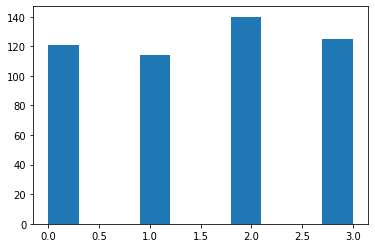

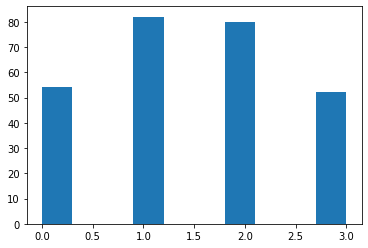

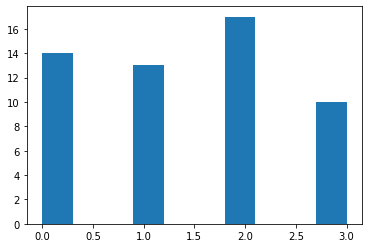

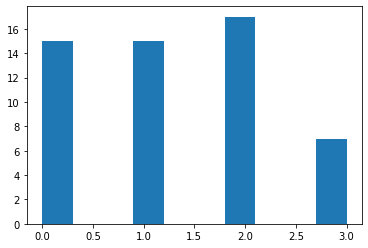

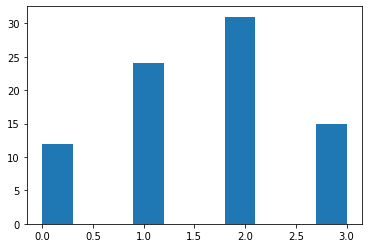

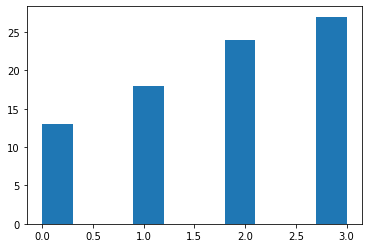

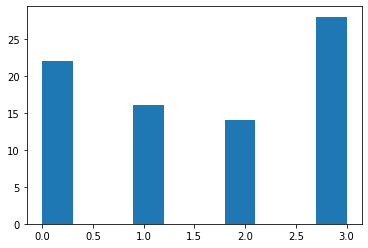

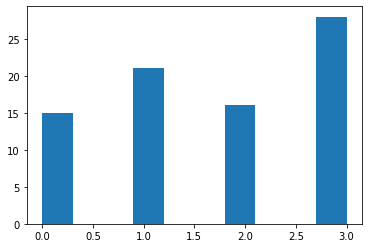

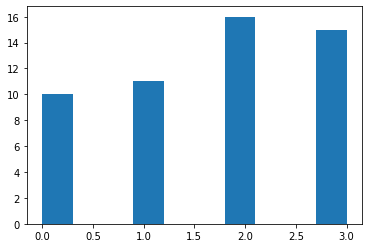

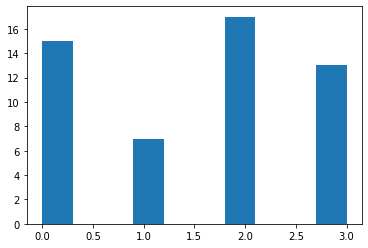

<Figure size 432x288 with 0 Axes>

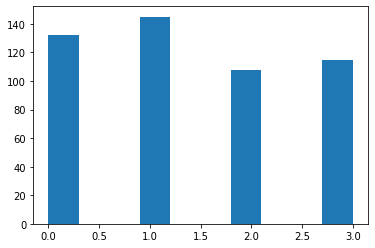

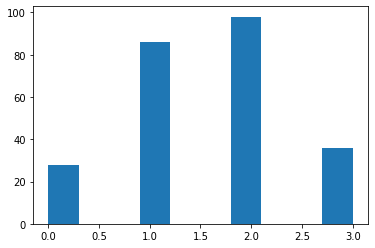

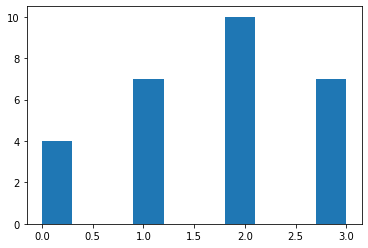

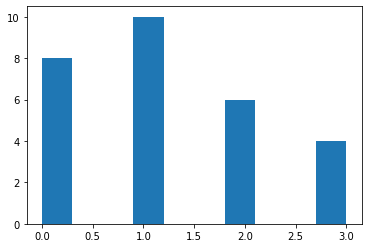

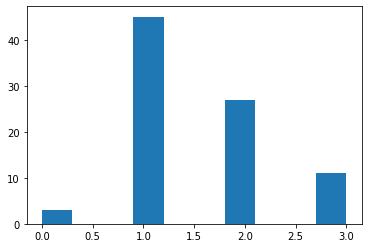

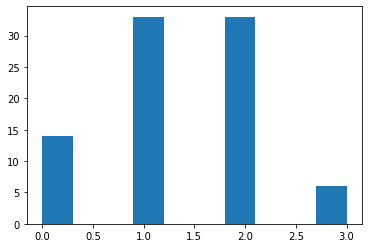

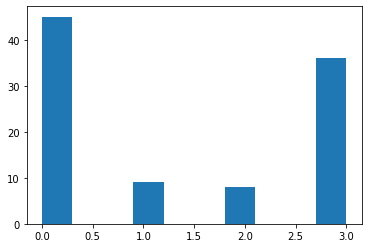

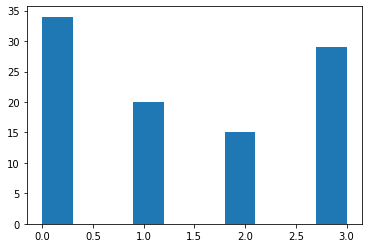

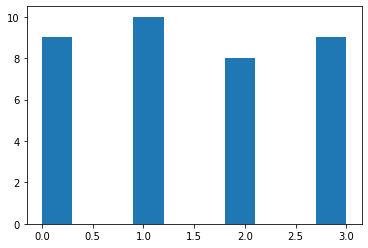

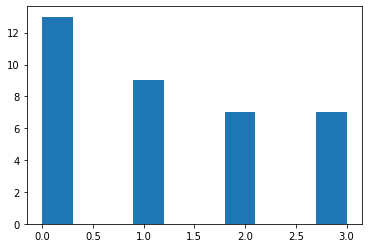

<Figure size 432x288 with 0 Axes>

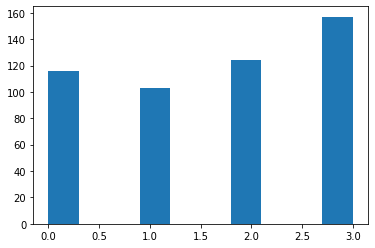

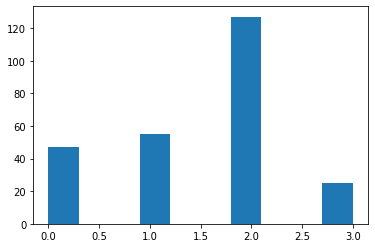

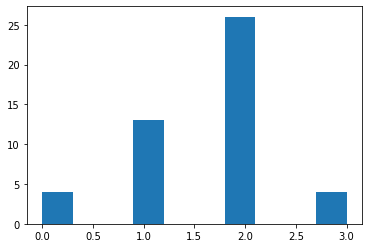

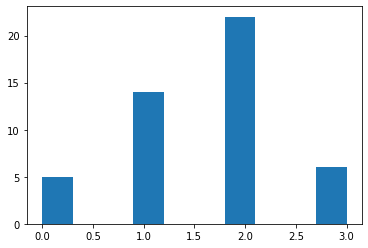

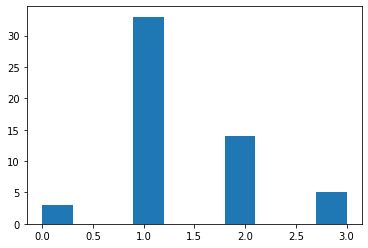

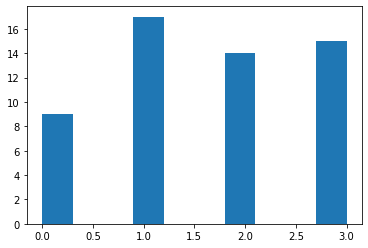

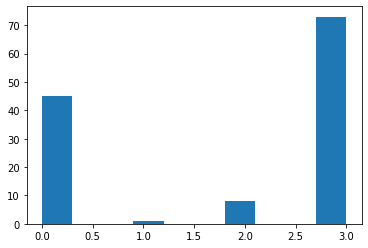

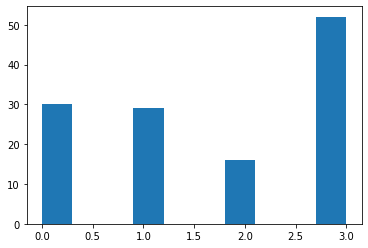

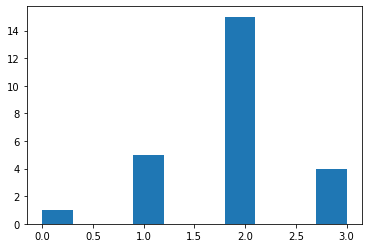

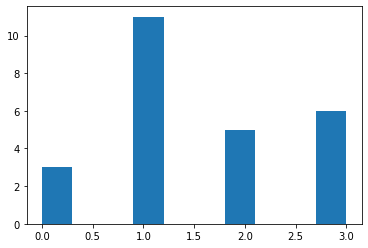

<Figure size 432x288 with 0 Axes>

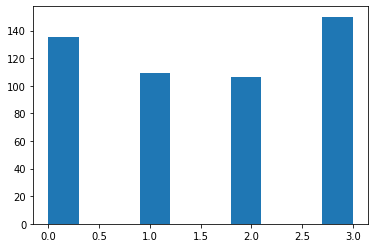

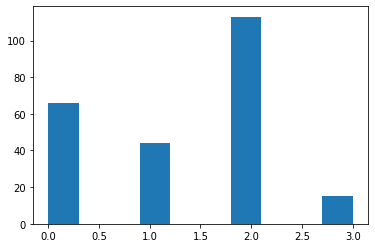

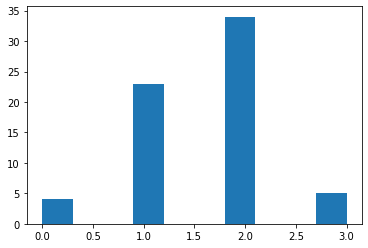

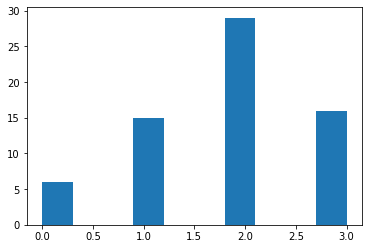

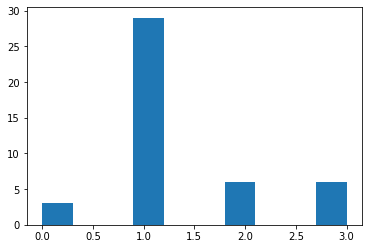

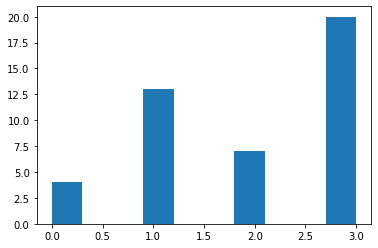

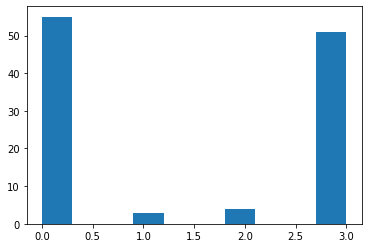

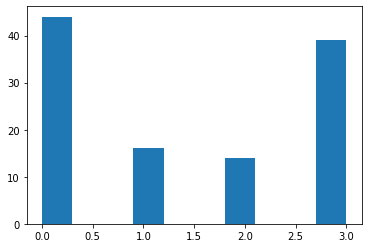

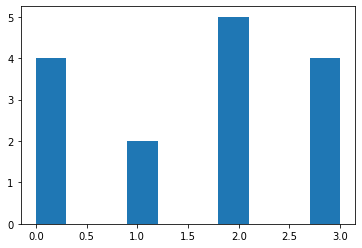

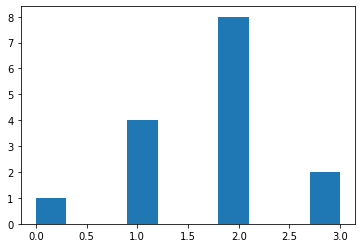

<Figure size 432x288 with 0 Axes>

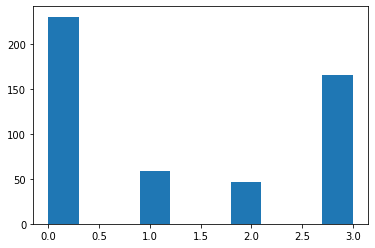

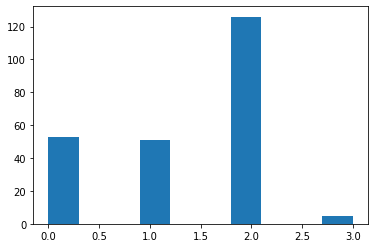

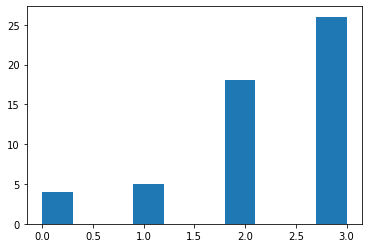

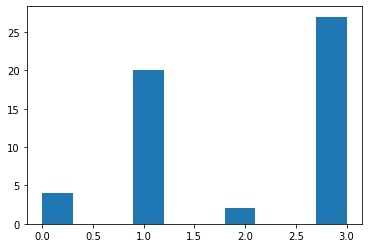

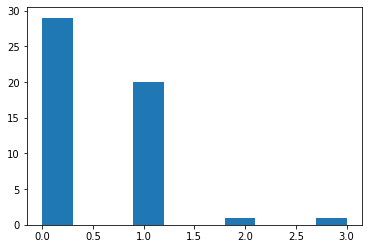

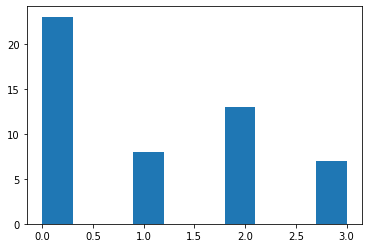

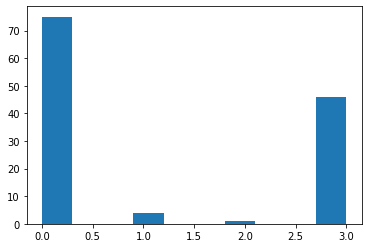

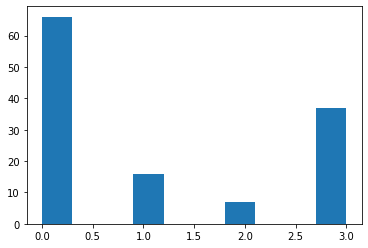

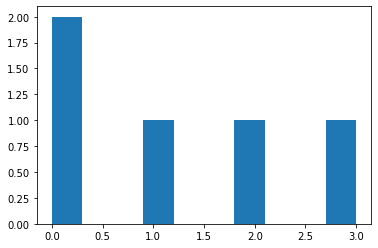

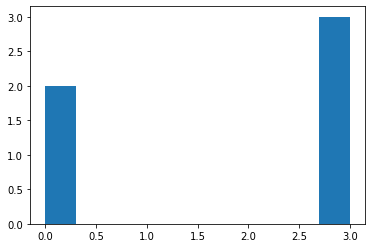

<Figure size 432x288 with 0 Axes>

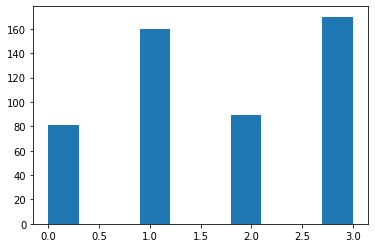

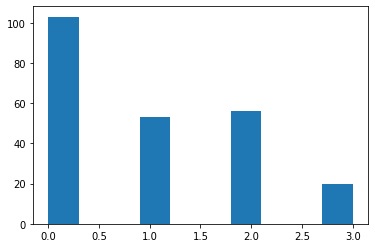

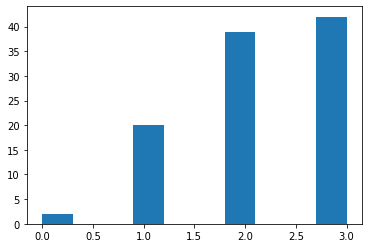

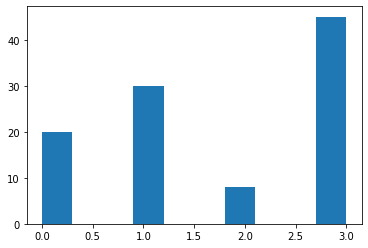

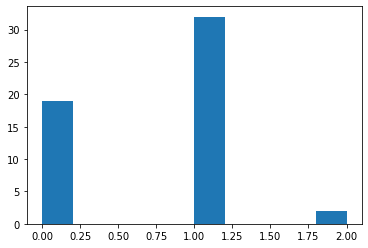

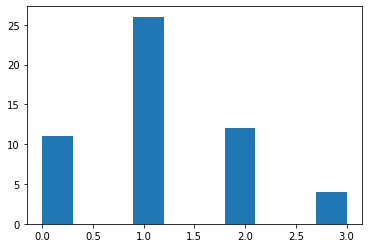

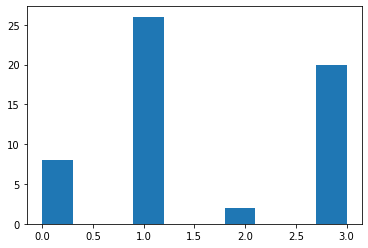

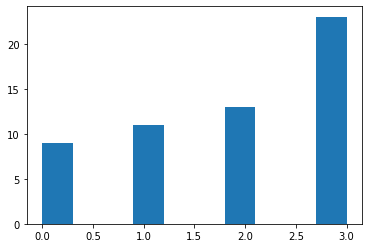

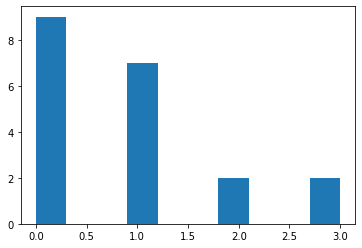

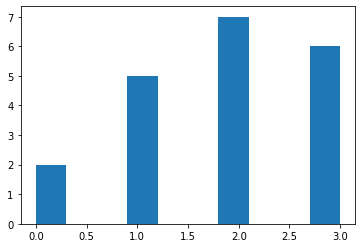

<Figure size 432x288 with 0 Axes>

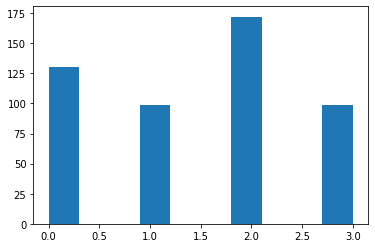

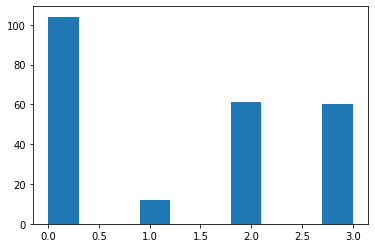

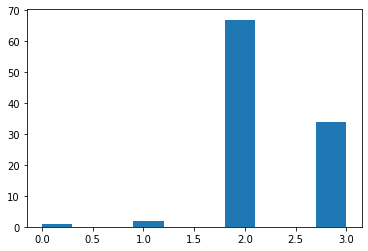

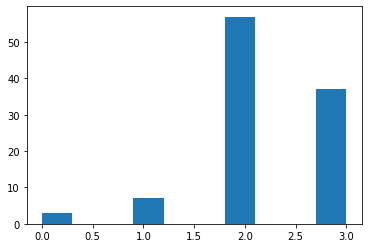

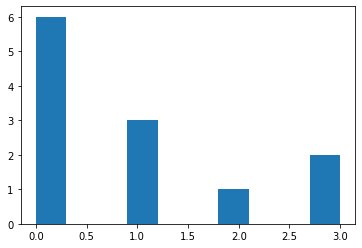

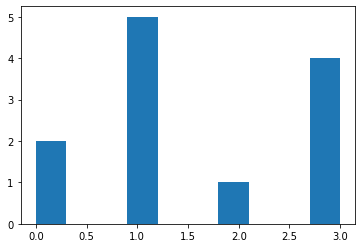

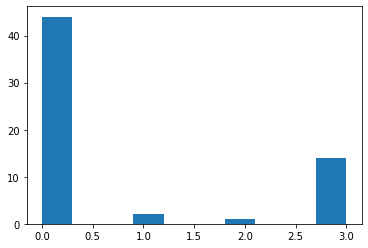

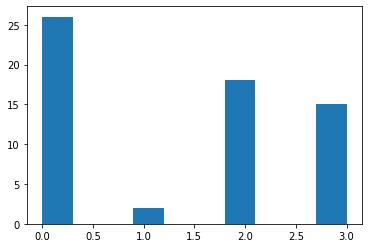

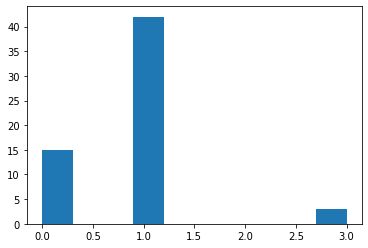

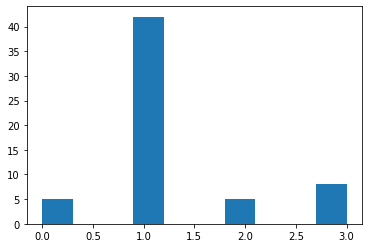

<Figure size 432x288 with 0 Axes>

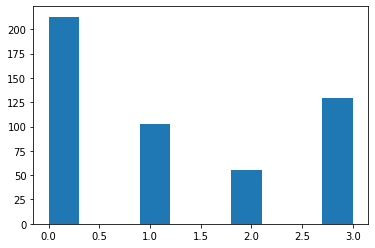

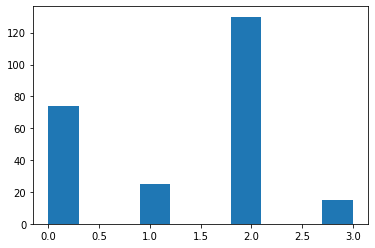

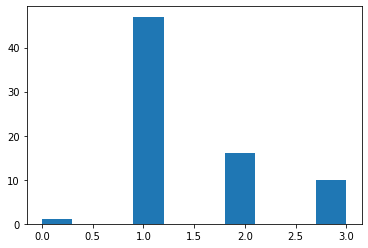

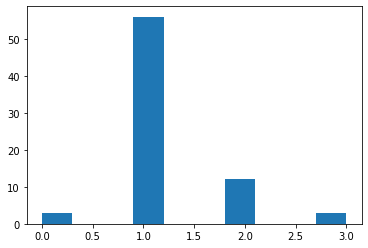

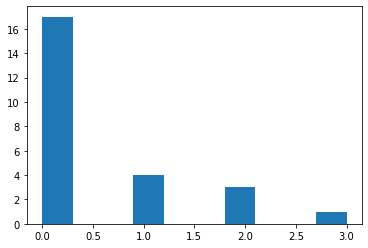

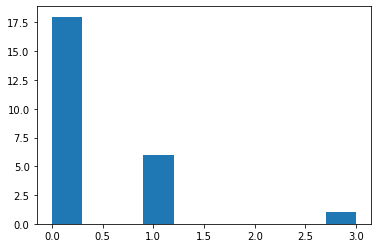

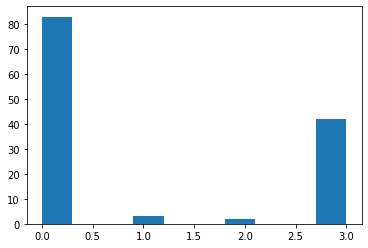

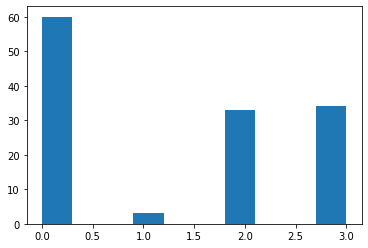

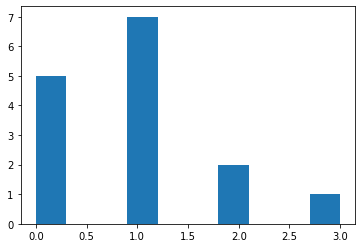

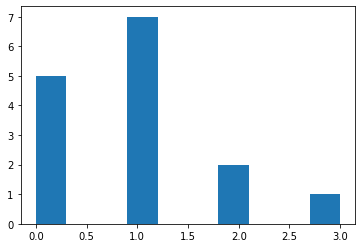

<Figure size 432x288 with 0 Axes>

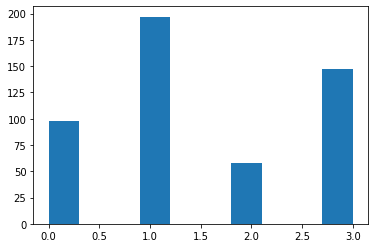

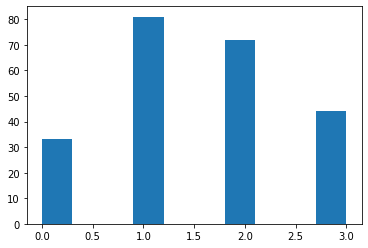

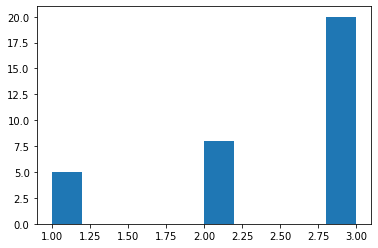

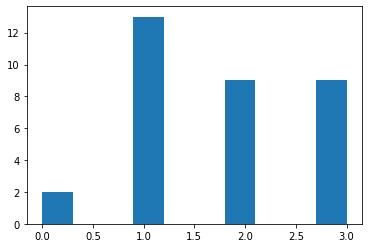

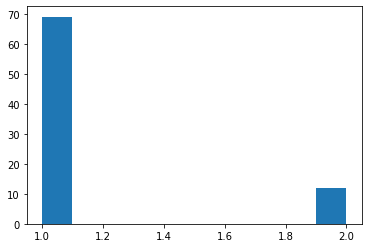

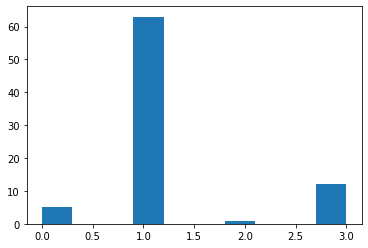

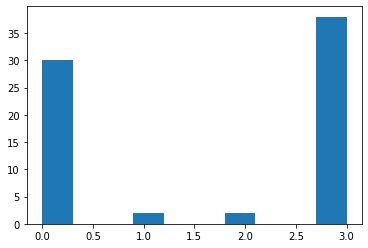

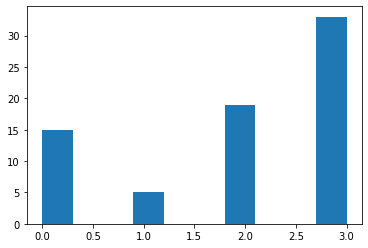

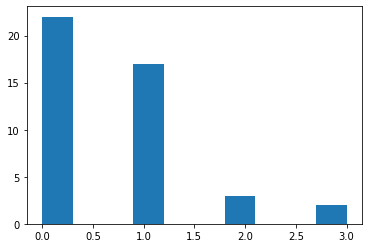

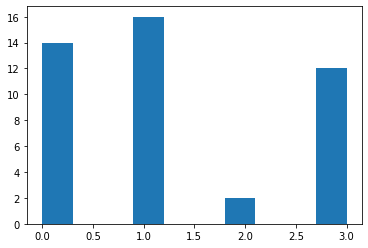

In [0]:
# Iterate the game
episodes = 5000
a1_talk = []
a1_act = []
a2_talk = []
a2_act = []
who_talks_arr = []
scores1 = []
scores2 = []

wins = 1
loses = 1

for e in range(episodes):
    score1 = 0
    score2 = 0
    
    state1, state2, _, _, who_talks = env.step(0, 0, 0)
    #print("state 1: {}, state 2: {}, talks: {}".format(state1, state2, who_talks))
    # agent 1 talks
    if who_talks:
        action1 = agent1.act(state1)
        state1, state2, reward1, reward2, who_talks = env.step(action1[0], 4, 0)  
        score1 += reward1
        action2 = agent2.act(state2)
        #print("state 1: {}, state 2: {}, talks: {}".format(state1, state2, who_talks))
    
        
    # everyone chooses
        next_state1, next_state2, reward1, reward2, who_talks = env.step(action1[1], action2[1], 1)     
        score1 += reward1
        score2 += reward2
        #print("state 1: {}, state 2: {}, talks: {}".format(state1, state2, who_talks))
    
    else:
        action2 = agent2.act(state2)
        state1, state2, reward1, reward2, who_talks = env.step(0, action2[0], 0)   
        score2 += reward2
        action1 = agent1.act(state1)
        #print("state 1: {}, state 2: {}, talks: {}".format(state1, state2, who_talks))
    
    # everyone chooses
        next_state1, next_state2, reward1, reward2, who_talks = env.step(action1[1], action2[1], 1)     
        score1 += reward1
        score2 += reward2
        #print("state 1: {}, state 2: {}, talks: {}".format(state1, state2, who_talks))

    agent2.remember(state2, action2, reward2, next_state2)
    agent1.remember(state1, action1, reward1, next_state1)

    if e > 0 and e % 500 == 0:
        scores1_arr = np.array(scores1[e-500:e])
        a1_talk_arr = np.array(a1_talk[e-500:e])
        a1_act_arr = np.array(a1_act[e-500:e])
        a2_talk_arr = np.array(a2_talk[e-500:e])
        a2_act_arr = np.array(a2_act[e-500:e])
        who_talks_arr_2 = np.array(who_talks_arr[e-500:e])
        plt.figure()
        plt.figure()
        plt.hist(a1_act_arr)
        plt.figure()
        plt.hist(a1_talk_arr[who_talks_arr_2==1])
        plt.figure()
        plt.hist(a1_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 0])
        plt.figure()
        plt.hist(a2_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 0])
        plt.figure()
        plt.hist(a1_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 1])
        plt.figure()
        plt.hist(a2_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 1])
        plt.figure()
        plt.hist(a1_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 2])
        plt.figure()
        plt.hist(a2_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 2])
        plt.figure()
        plt.hist(a1_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 3])
        plt.figure()
        plt.hist(a2_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 3])
        
    
    print("episode: {}/{}, score1: {}, score2: {}"
                  .format(e, episodes, score1, score2))
    if len(agent1.memory) > 10 and len(agent2.memory) > 10: 
        #if wins/loses < np.random.uniform(0,2):   
        agent1.replay(10)
        agent2.replay(10)
    
    a1_talk.append(action1[0])
    a1_act.append(action1[1])
    a2_talk.append(action2[0])
    a2_act.append(action2[1])
    who_talks_arr.append(who_talks)
    scores1.append(score1)
    scores2.append(score2)

(array([12.,  0.,  0.,  4.,  0.,  0.,  8.,  0.,  0.,  3.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <a list of 10 Patch objects>)

<Figure size 432x288 with 0 Axes>

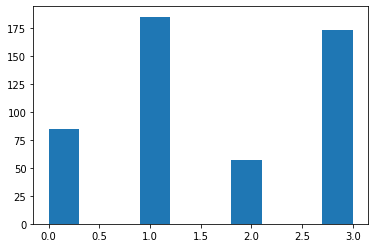

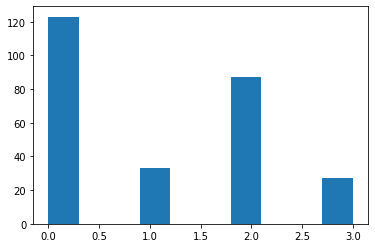

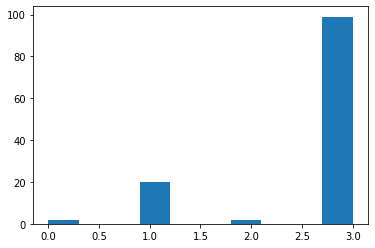

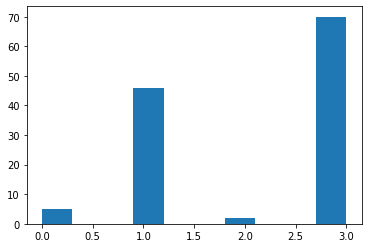

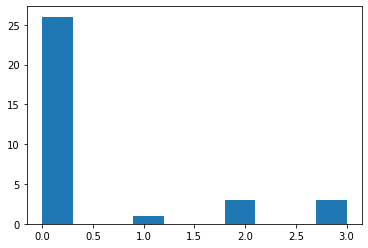

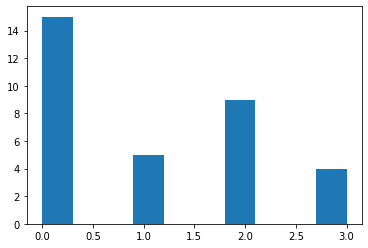

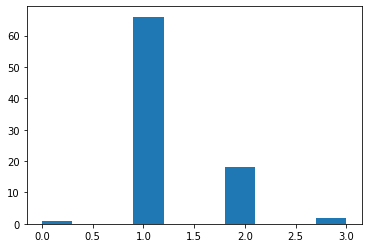

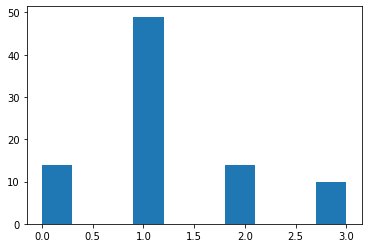

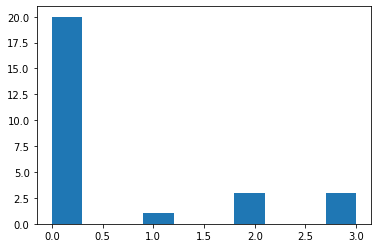

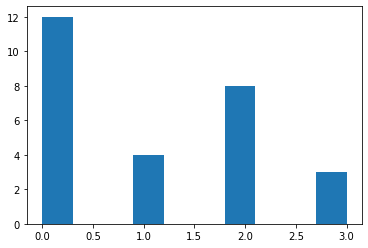

In [0]:
plt.figure()
plt.figure()
plt.hist(a2_act_arr)
plt.figure()
plt.hist(a2_talk_arr[who_talks_arr_2==0])
plt.figure()
plt.hist(a2_act_arr[who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 0])
plt.figure()
plt.hist(a1_act_arr[who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 0])
plt.figure()
plt.hist(a2_act_arr[who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 1])
plt.figure()
plt.hist(a1_act_arr[who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 1])
plt.figure()
plt.hist(a2_act_arr[who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 2])
plt.figure()
plt.hist(a1_act_arr[who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 2])
plt.figure()
plt.hist(a2_act_arr[who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 3])
plt.figure()
plt.hist(a1_act_arr[who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 3])

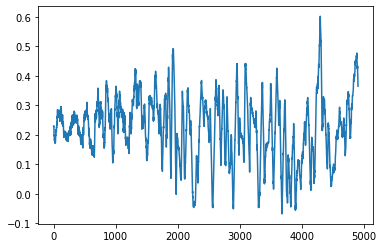

In [0]:
plt.plot(np.convolve(scores1, np.ones((100,))/100, mode='valid'))

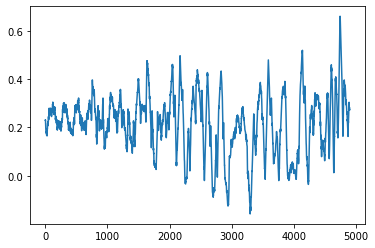

In [0]:
plt.plot(np.convolve(scores2, np.ones((100,))/100, mode='valid'))

## Inner speach added

In [9]:
class DQNAgent_student_teacher:
    def __init__(self, talking_action_size, choices, memory_size = 11): 
        self.memory = collections.deque(maxlen=memory_size)
        self.gamma = 0.95    # discount rate
        self.epsilon = 1.0  # exploration rate
        self.epsilon_min = 0.1
        self.epsilon_decay = 0.999
        self.learning_rate_bad = 0.0001
        self.learning_rate_good = 0.0001
        self.talking_action_size = talking_action_size
        self.choices = choices
        self.model = self._build_model_student_teacher()
 
 
    def _build_model_student_teacher(self):
        # Neural Net for Deep-Q learning Model
        
        model = Sequential()
        #model.add(Dense(25, input_dim=self.talking_action_size + self.talking_action_size +self.talking_action_size+ 1, activation='relu')) # one input - the game role
        model.add(Dense(25, input_dim=self.talking_action_size + self.talking_action_size+ 1, activation='relu')) # one input - the game role
        model.add(Dense(15, activation='softmax'))
        model.add(Dense(10, activation='relu'))
 
        model.add(Dense(self.choices, activation='linear'))
        model.compile(loss='mse',
                      optimizer=Adam(lr=self.learning_rate_bad, beta_1=0.1, beta_2=0.99))
        return model
       
   
    def remember(self, state, action, reward, next_state):
        self.memory.append((state, action, reward, next_state))
                           
    def act(self, state):
        if np.random.rand() <= self.epsilon:
            return [random.randrange(self.talking_action_size), random.randrange(self.choices)]
 
        
        max_q = -float("infinity")
        max_talk = None
        max_action = None
 
        for i in range(self.talking_action_size):
            talking = np.zeros(self.talking_action_size)
            talking[i] = 1
 
            state_cur = np.expand_dims(np.hstack([state, talking]), axis=0)
            act_values = self.model.predict(state_cur, batch_size=1)
 
            cur_max = np.max(act_values)
           
            if cur_max > max_q:
 
              max_q = cur_max
              max_action = np.argmax(act_values[0])
              max_talk = i
 
            assert max_talk is not None
            assert max_action is not None
 
        return [max_talk, max_action]
                           
    def replay(self, batch_size):
        for i in self.memory:
            minibatch = random.sample(self.memory, batch_size)
        my_x = []
        my_y = []
        for state, action, reward, next_state in minibatch:
            next_state = np.expand_dims(next_state, axis=0)
            #state = np.expand_dims(state, axis=0)
            target = reward
            one_hot_talk = np.zeros(self.talking_action_size)
            one_hot_talk[action[0]] = 1
            cur_state = np.expand_dims(np.hstack([state, one_hot_talk]), axis=0)
            target_f = self.model.predict(cur_state, batch_size=1)
            target_f[0][action[1]] = target # choose
            cur_state = np.squeeze(cur_state)
            target_f = np.squeeze(target_f)
            my_x.append(cur_state)
            my_y.append(target_f)
        
        my_x = np.array(my_x)
        my_y = np.array(my_y)
        self.model.train_on_batch(my_x, my_y)
 
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

In [10]:
num_choices = 4
num_talking_symbols = 4
winning_reward = 1
mean_sample = 100
punishment_weight = 3

agent1 = DQNAgent_student_teacher(num_talking_symbols, num_choices)
agent2 = DQNAgent_student_teacher(num_talking_symbols, num_choices) 
env = Two_Roles_Game(num_choices, winning_reward, mean_sample, num_talking_symbols, punishment_weight) 

episode: 500/10000, score1: 0, score2: 0.27
episode: 1000/10000, score1: 0.12000000000000002, score2: 0


/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:105: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:107: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


episode: 1500/10000, score1: 0, score2: -0.6800000000000002


/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:91: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory.

episode: 2000/10000, score1: 0.36, score2: 0.39
episode: 2500/10000, score1: 0, score2: 0.09
episode: 3000/10000, score1: -1.2000000000000002, score2: 0.23999999999999996
episode: 3500/10000, score1: 0.61, score2: 1.45
episode: 4000/10000, score1: -0.18, score2: 0.42000000000000004
episode: 4500/10000, score1: 0, score2: 0.79
episode: 5000/10000, score1: 0.66, score2: 0
episode: 5500/10000, score1: 0, score2: 0.25
episode: 6000/10000, score1: 0.05999999999999997, score2: 0
episode: 6500/10000, score1: -0.06000000000000005, score2: -0.21000000000000002
episode: 7000/10000, score1: 0.21000000000000002, score2: -0.42000000000000004
episode: 7500/10000, score1: 0.3699999999999999, score2: 0.3699999999999999
episode: 8000/10000, score1: 0.6000000000000001, score2: 0
episode: 8500/10000, score1: 1.54, score2: 1.51
episode: 9000/10000, score1: 0.61, score2: 0
episode: 9500/10000, score1: 0.58, score2: 0


<Figure size 432x288 with 0 Axes>

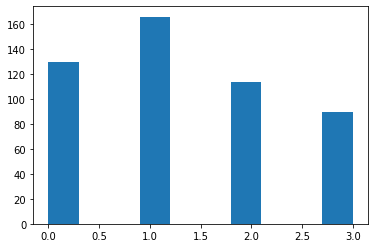

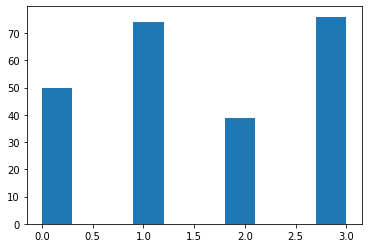

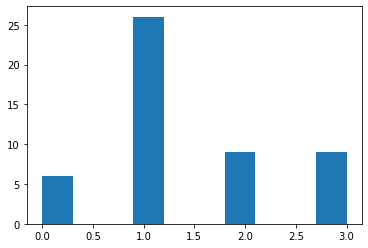

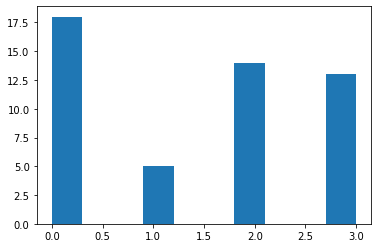

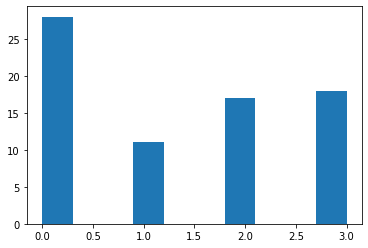

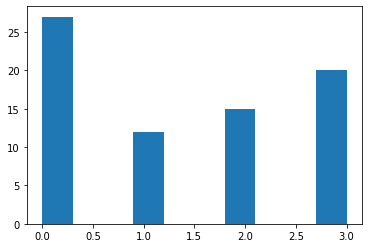

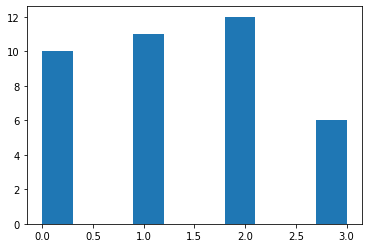

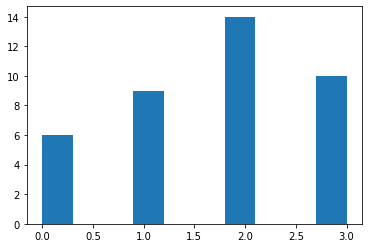

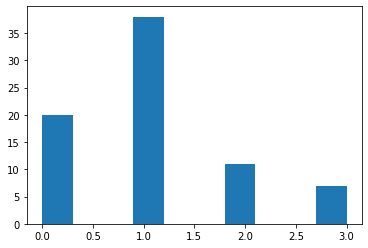

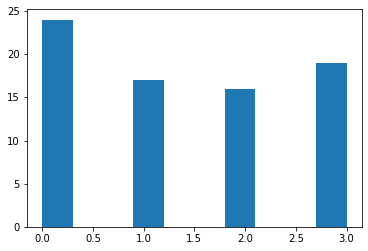

<Figure size 432x288 with 0 Axes>

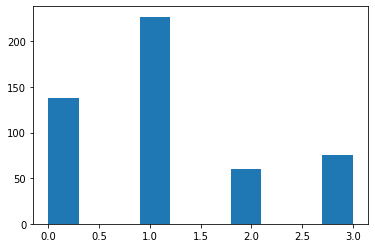

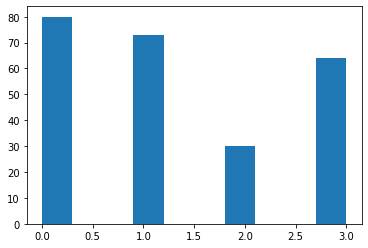

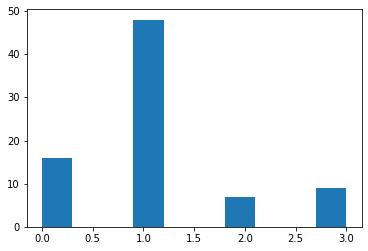

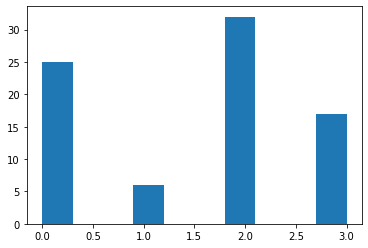

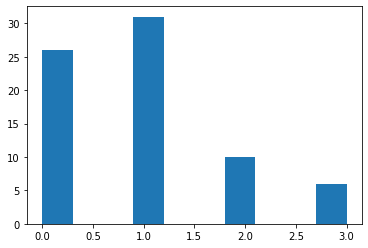

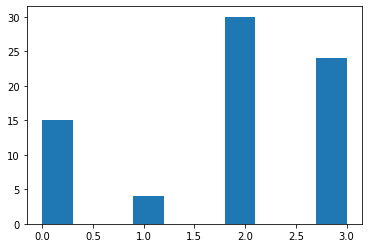

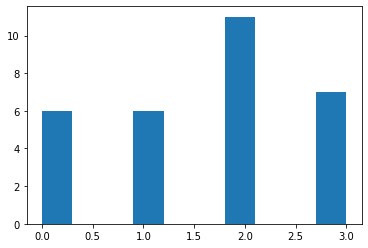

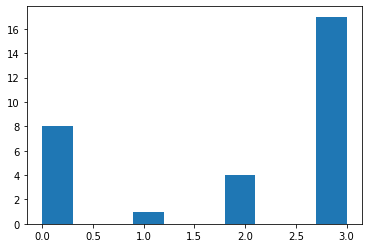

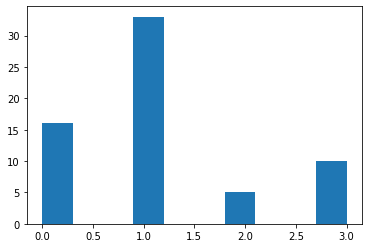

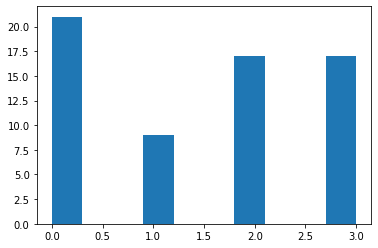

<Figure size 432x288 with 0 Axes>

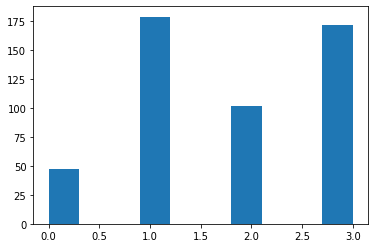

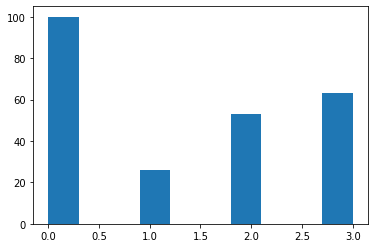

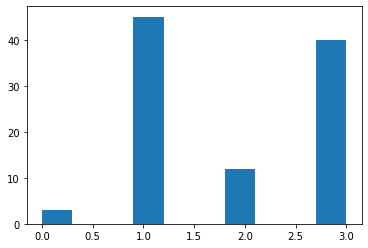

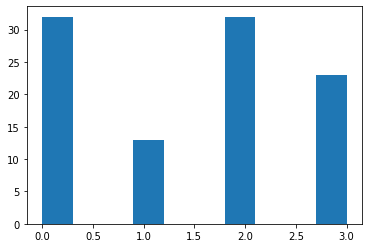

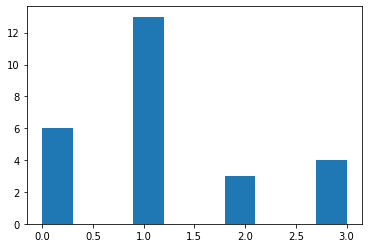

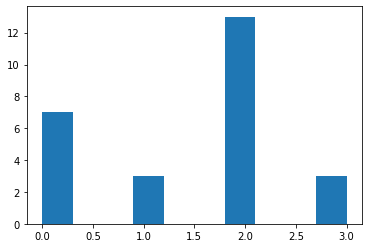

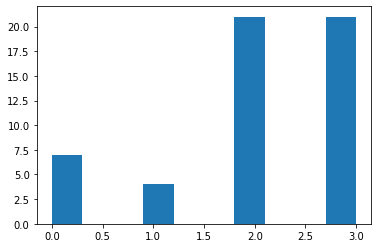

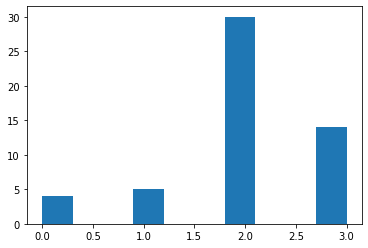

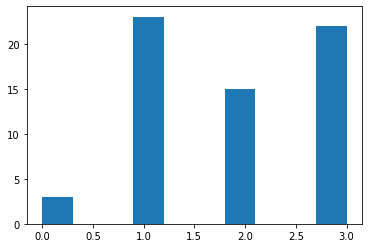

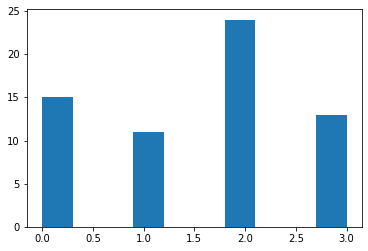

<Figure size 432x288 with 0 Axes>

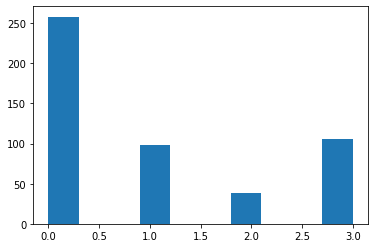

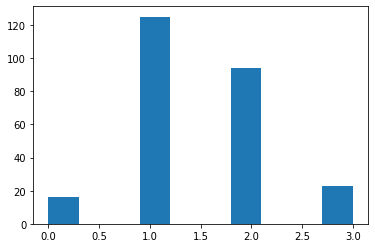

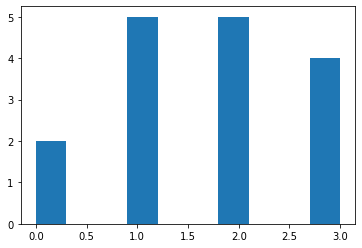

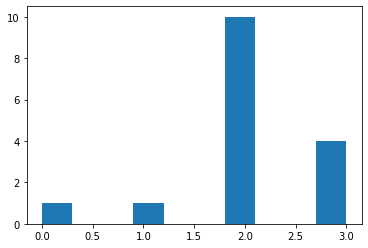

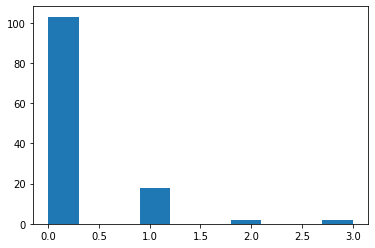

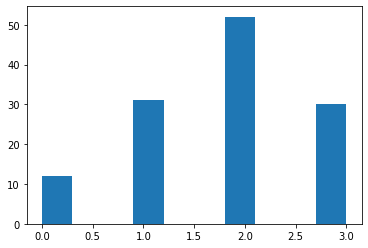

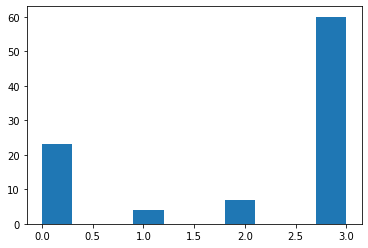

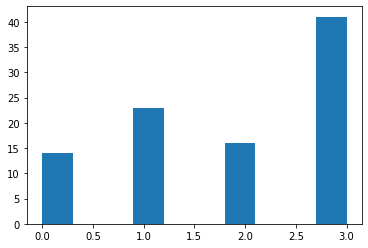

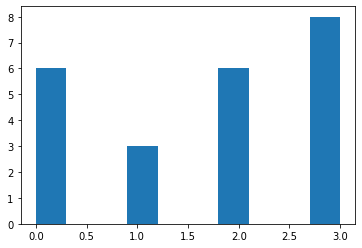

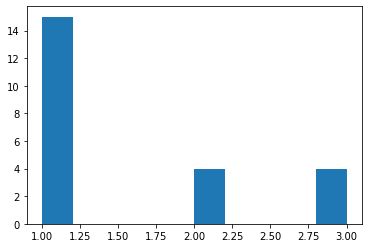

<Figure size 432x288 with 0 Axes>

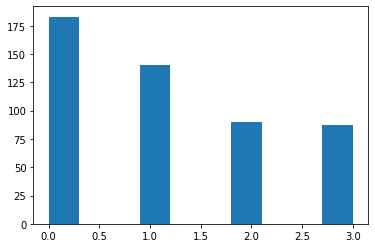

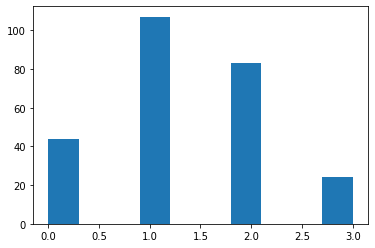

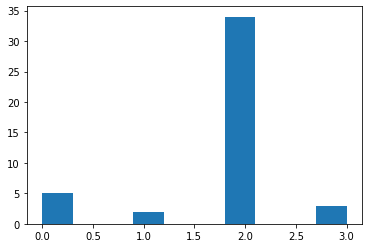

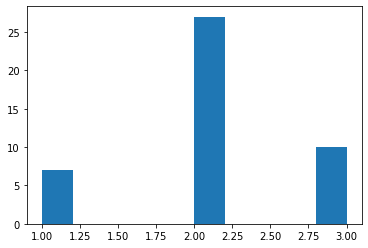

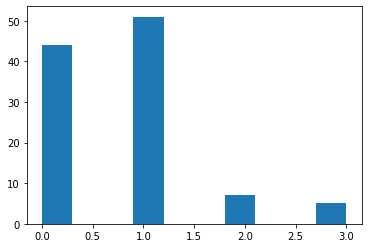

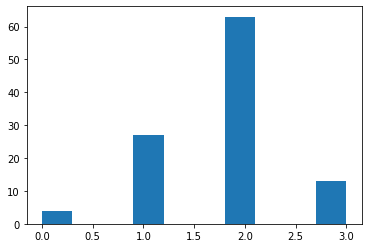

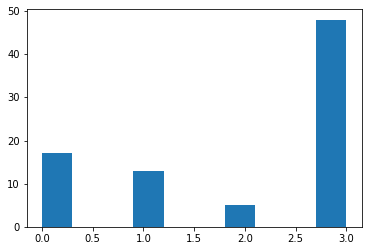

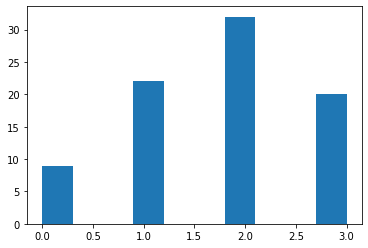

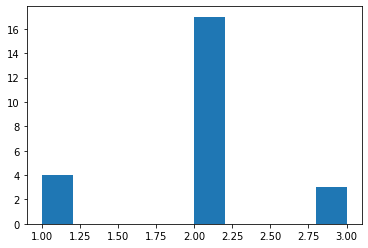

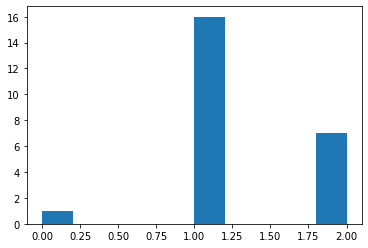

<Figure size 432x288 with 0 Axes>

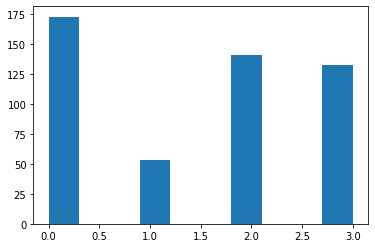

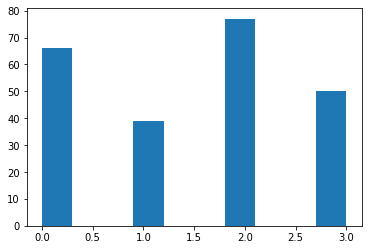

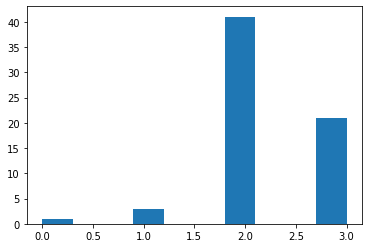

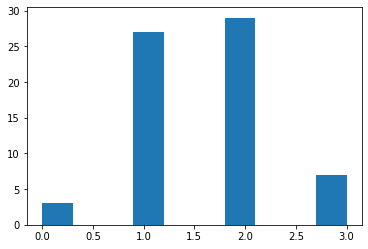

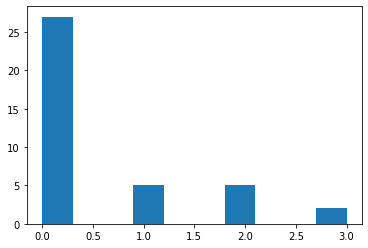

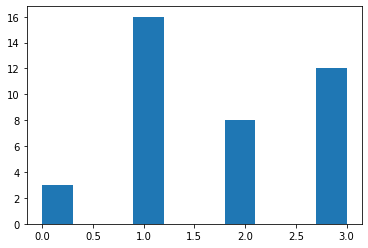

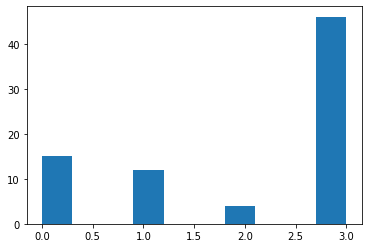

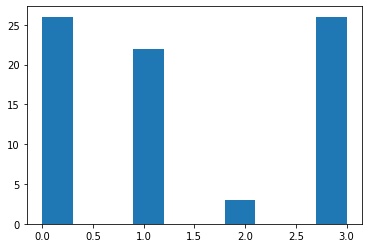

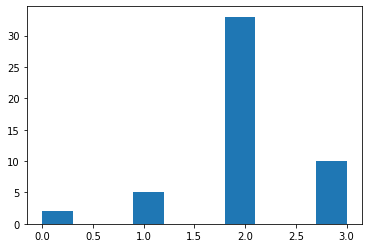

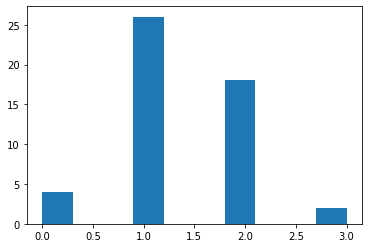

<Figure size 432x288 with 0 Axes>

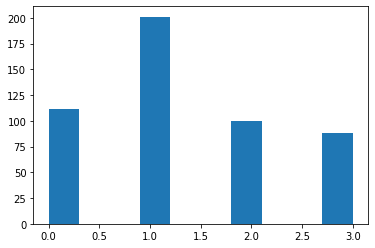

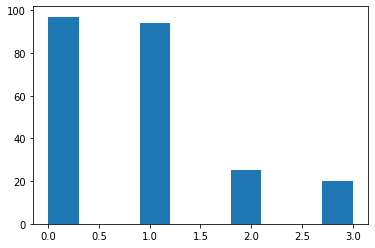

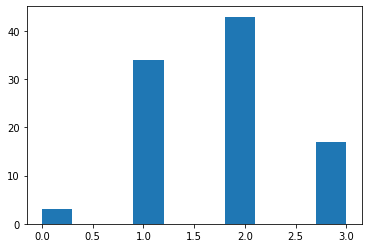

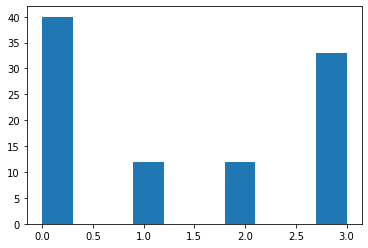

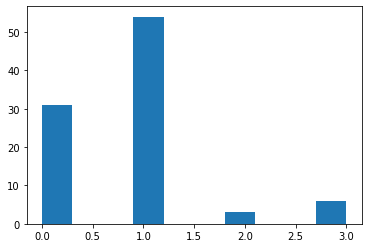

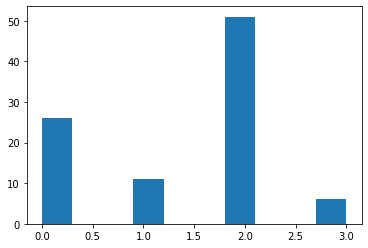

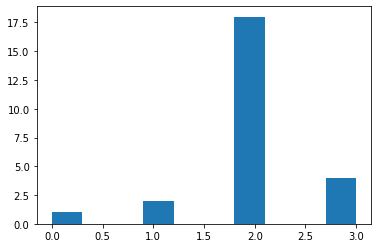

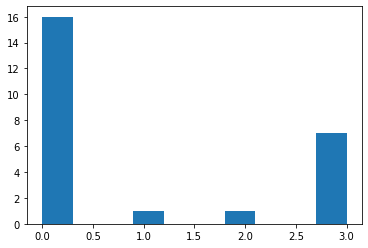

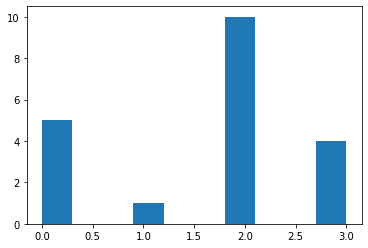

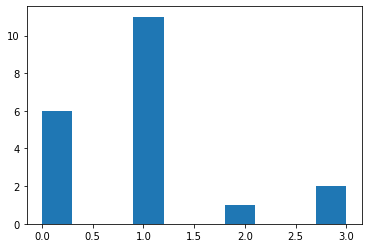

<Figure size 432x288 with 0 Axes>

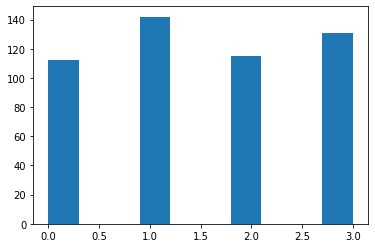

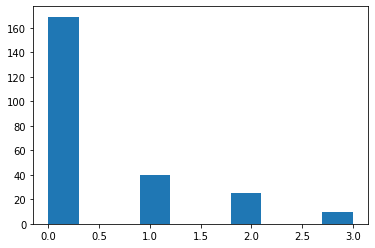

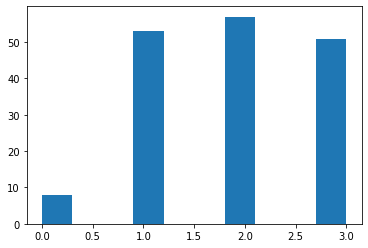

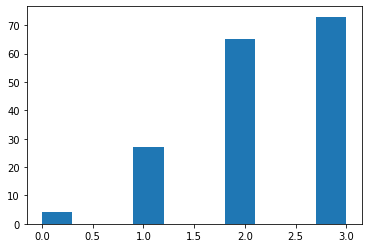

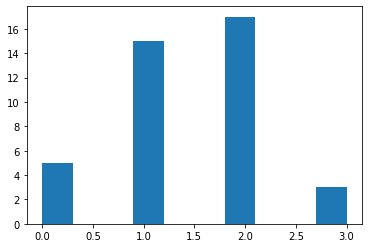

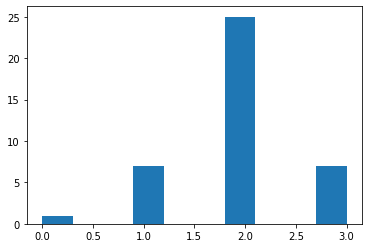

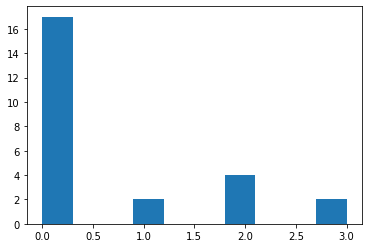

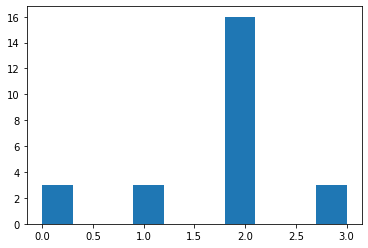

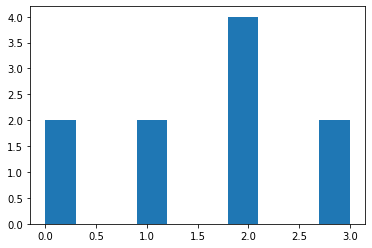

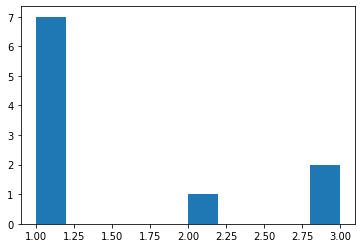

<Figure size 432x288 with 0 Axes>

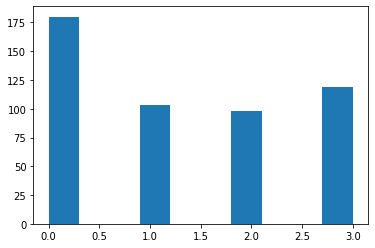

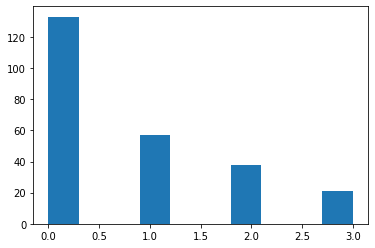

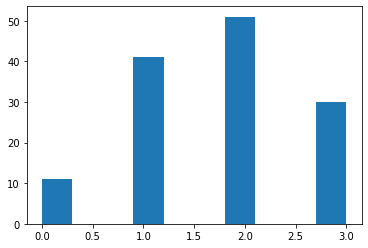

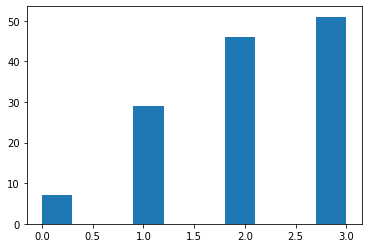

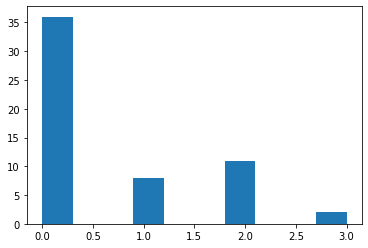

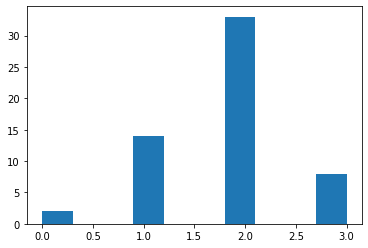

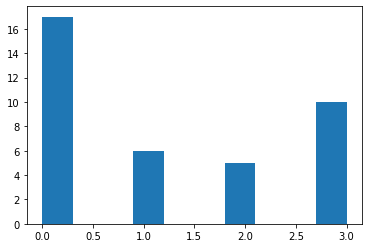

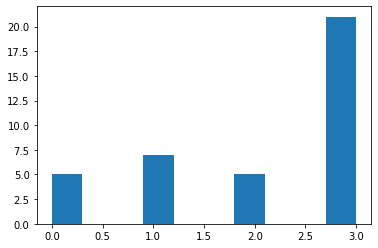

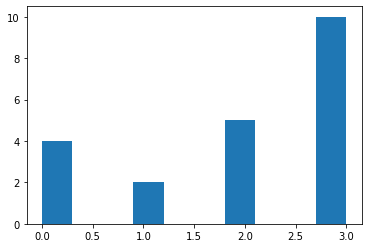

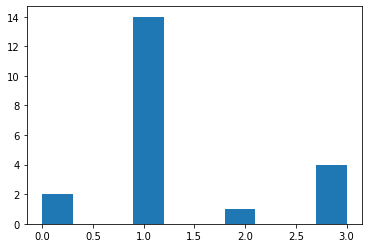

<Figure size 432x288 with 0 Axes>

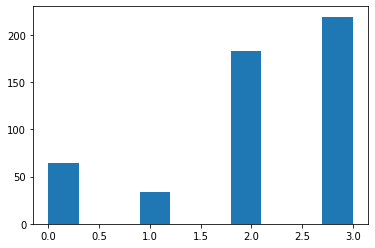

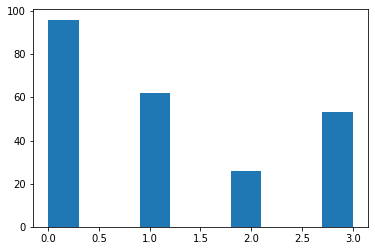

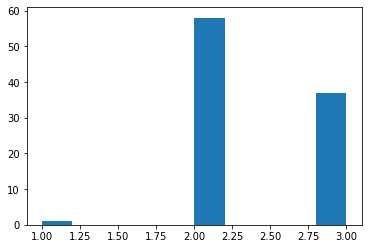

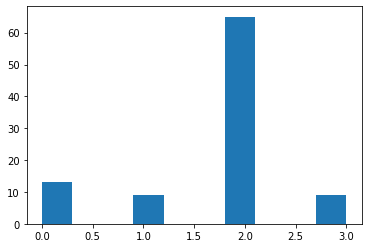

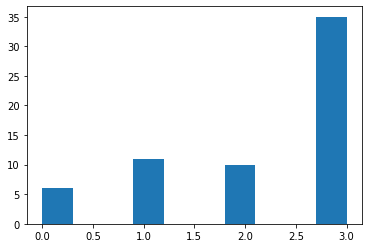

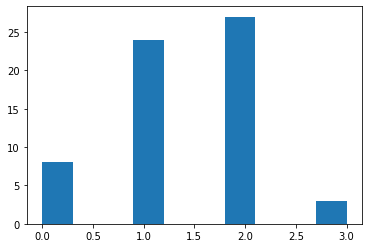

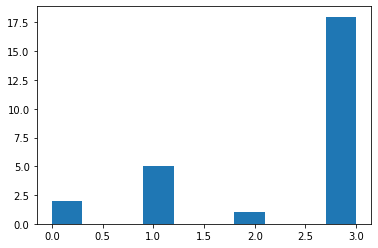

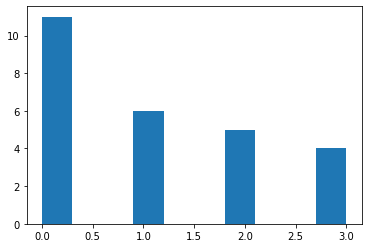

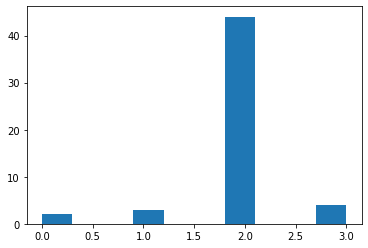

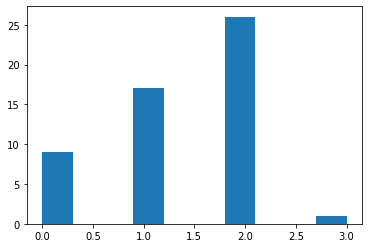

<Figure size 432x288 with 0 Axes>

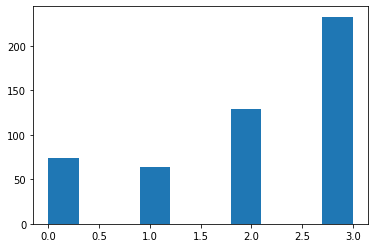

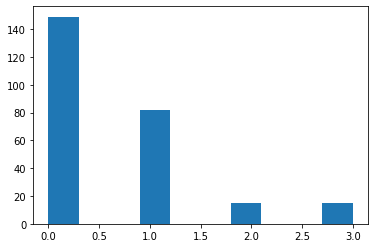

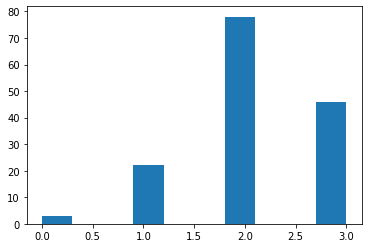

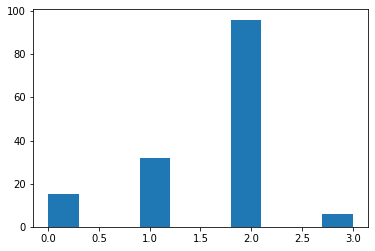

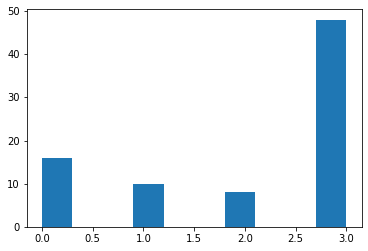

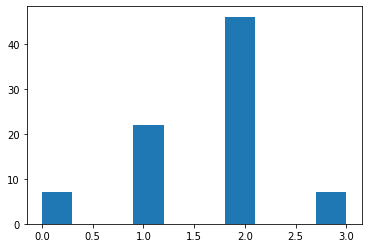

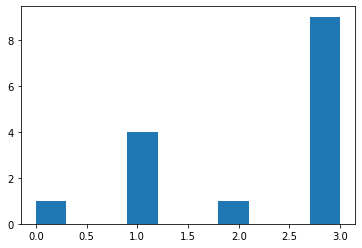

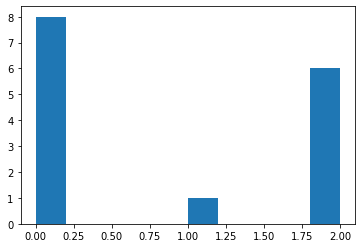

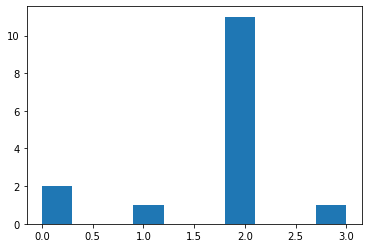

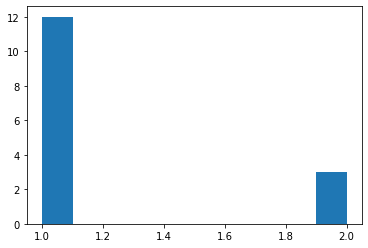

<Figure size 432x288 with 0 Axes>

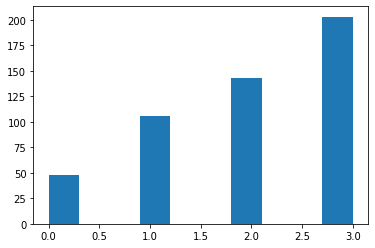

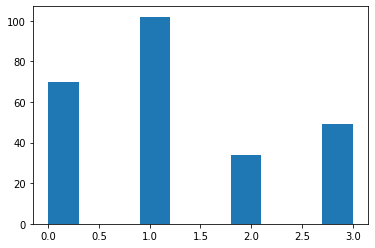

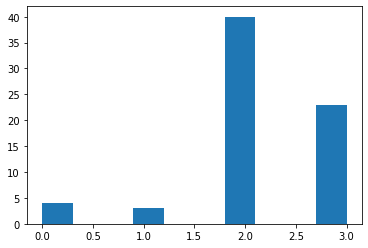

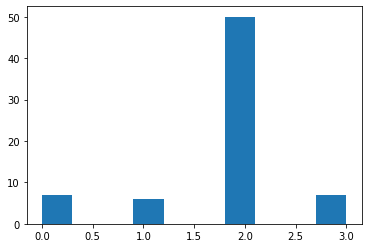

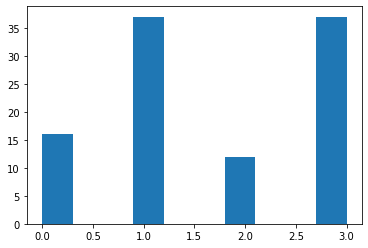

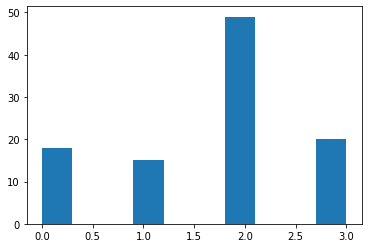

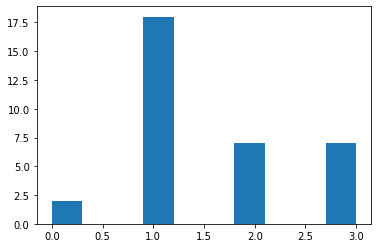

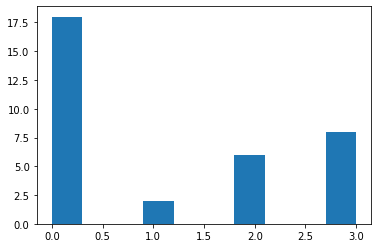

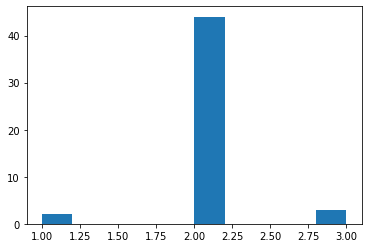

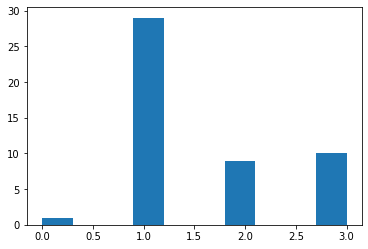

<Figure size 432x288 with 0 Axes>

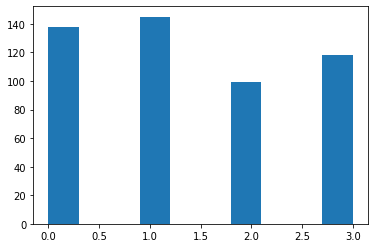

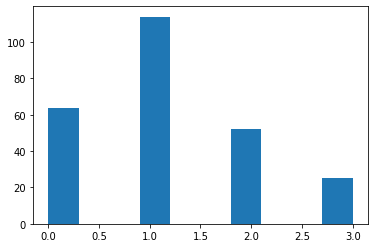

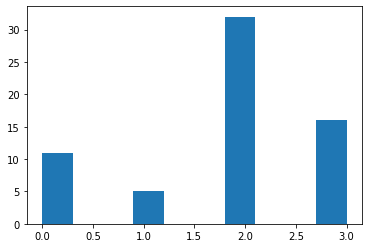

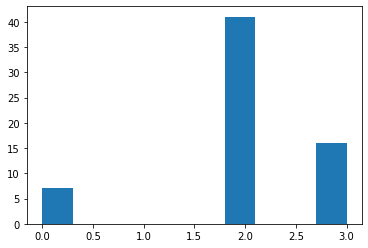

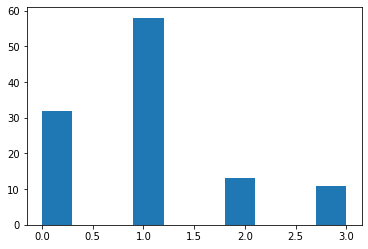

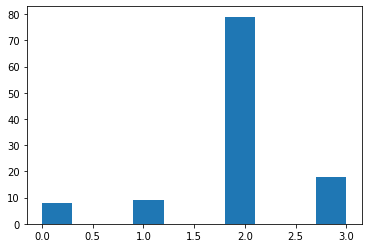

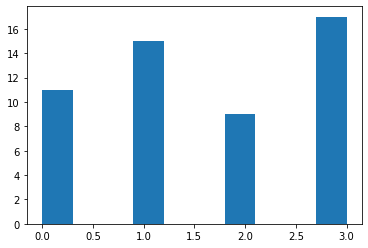

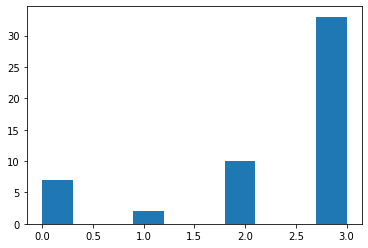

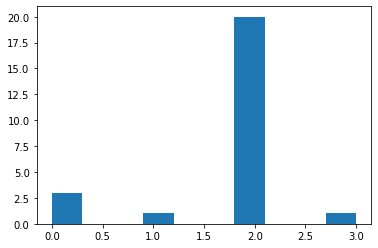

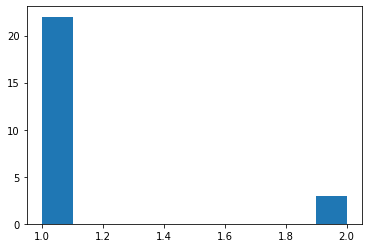

<Figure size 432x288 with 0 Axes>

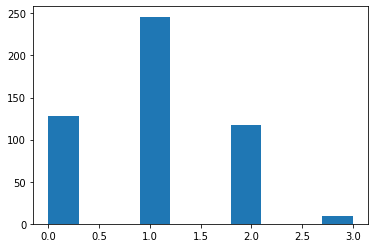

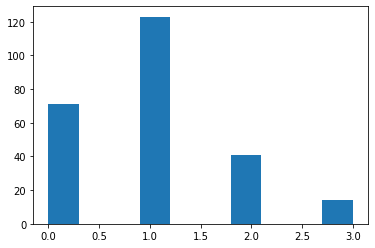

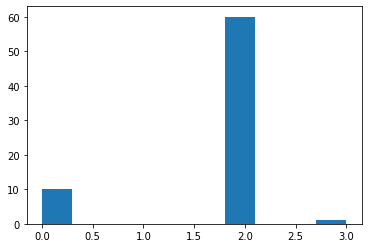

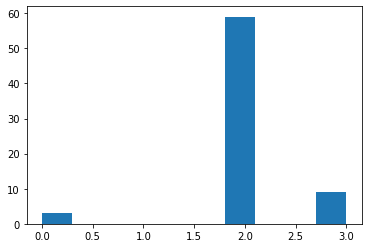

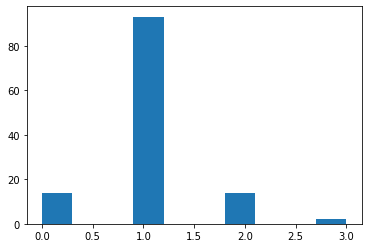

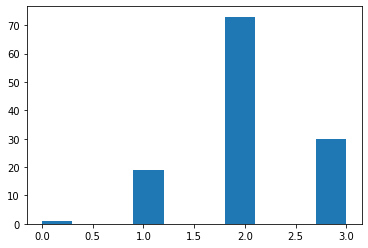

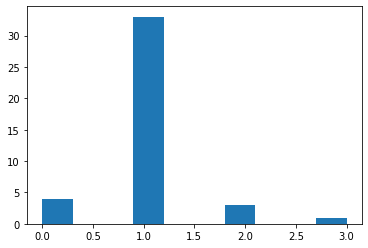

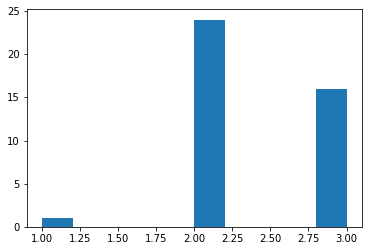

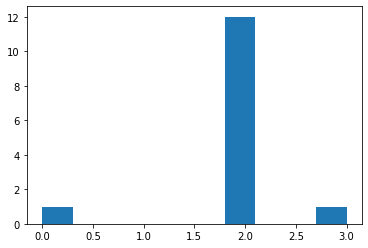

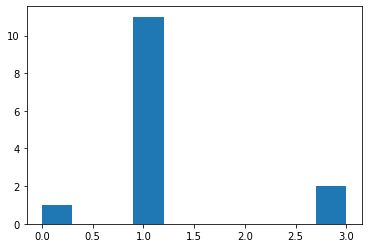

<Figure size 432x288 with 0 Axes>

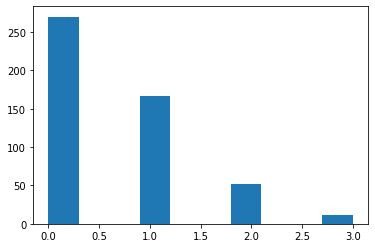

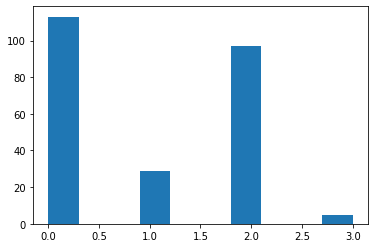

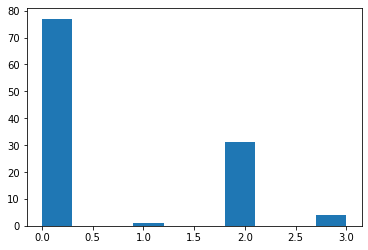

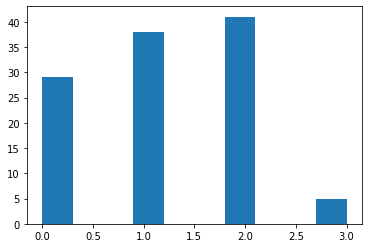

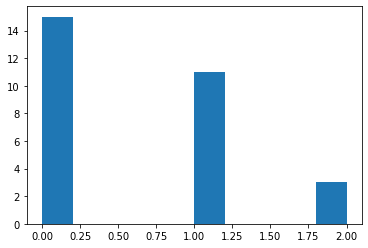

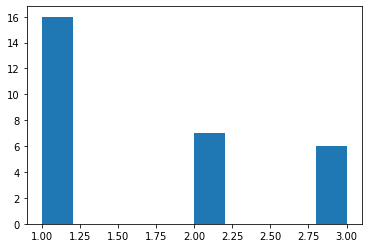

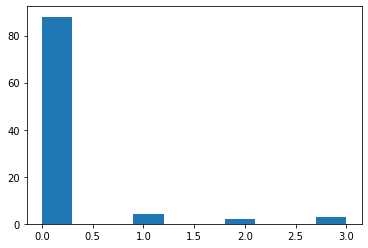

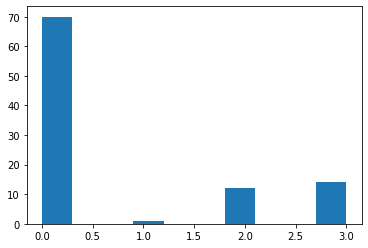

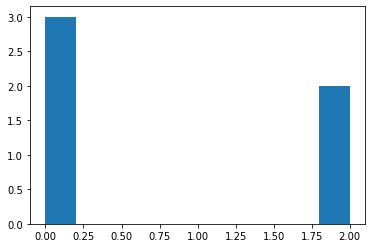

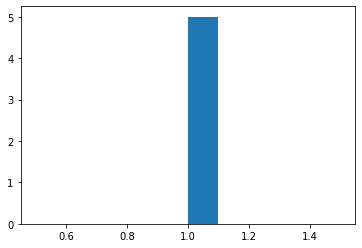

<Figure size 432x288 with 0 Axes>

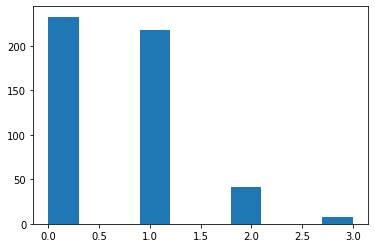

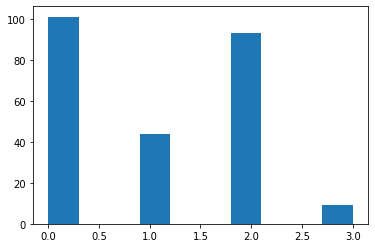

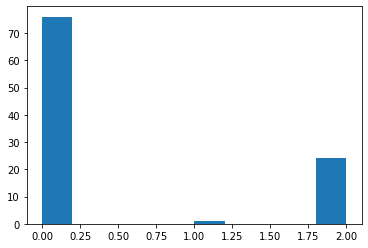

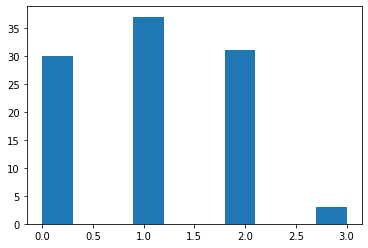

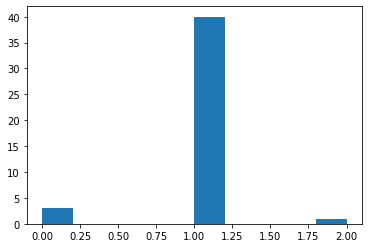

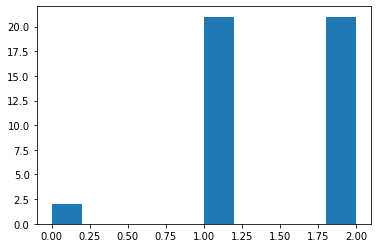

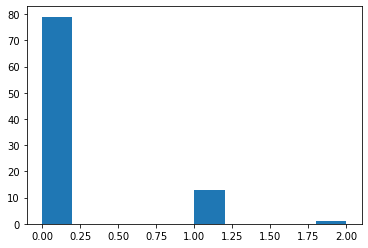

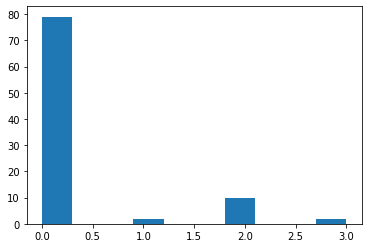

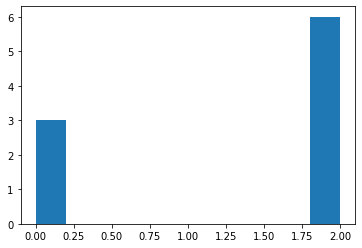

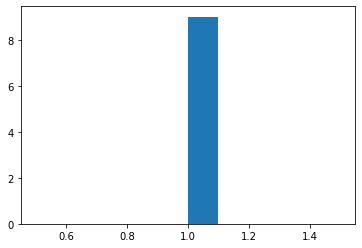

<Figure size 432x288 with 0 Axes>

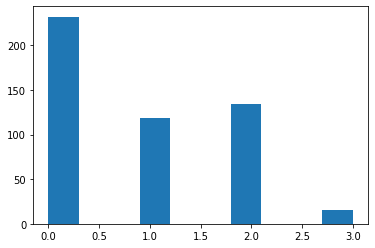

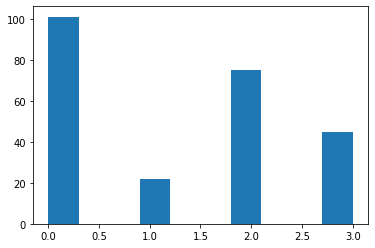

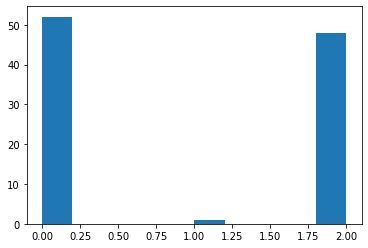

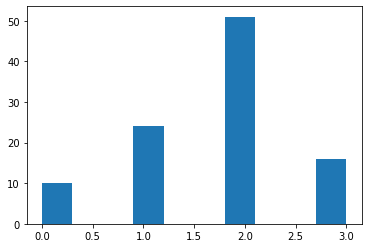

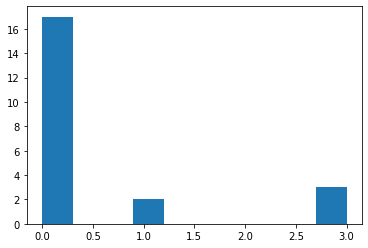

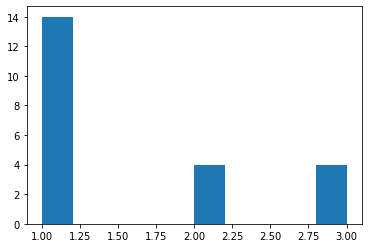

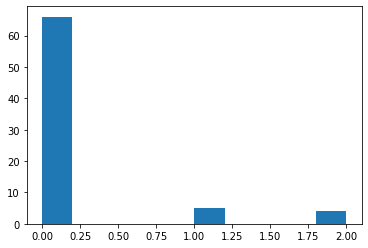

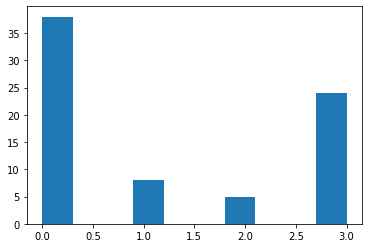

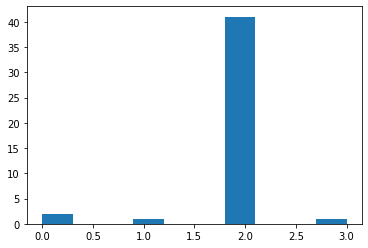

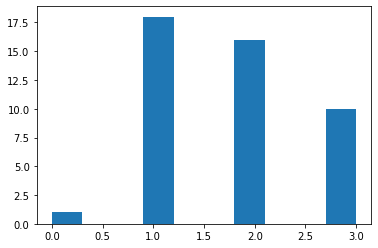

<Figure size 432x288 with 0 Axes>

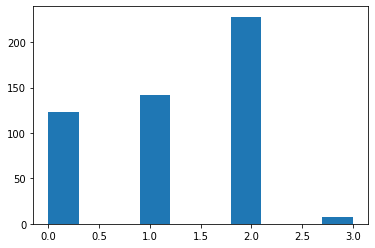

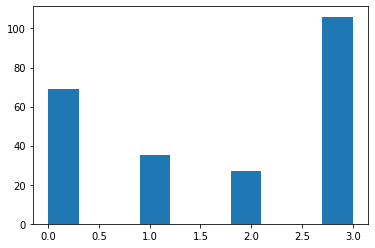

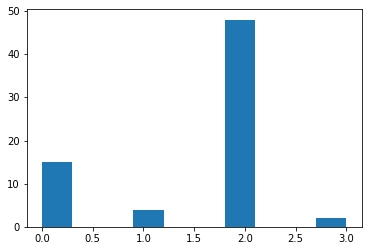

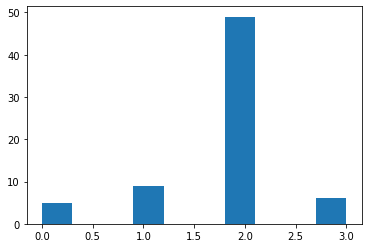

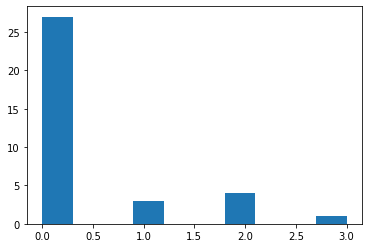

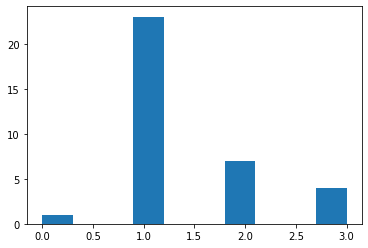

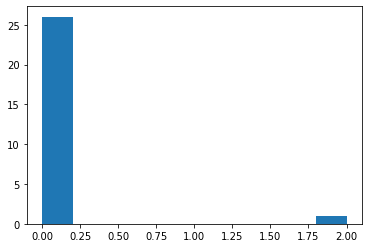

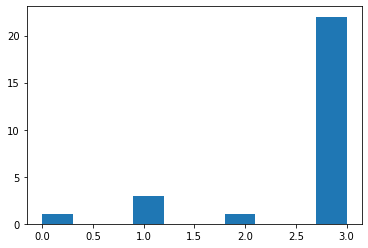

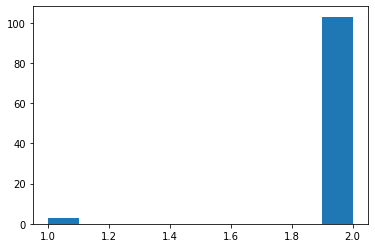

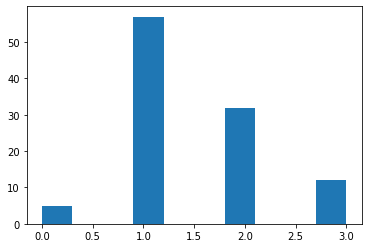

<Figure size 432x288 with 0 Axes>

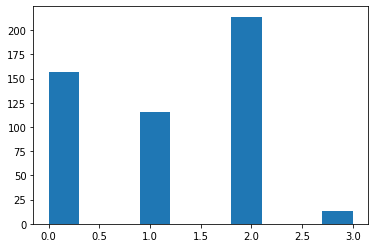

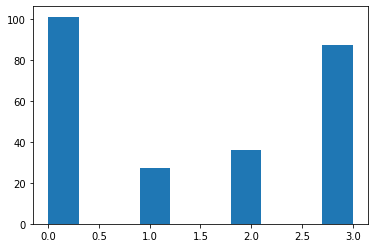

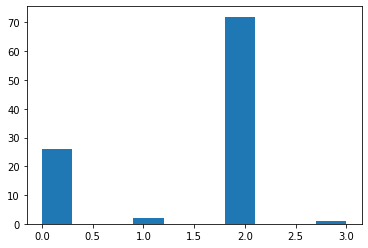

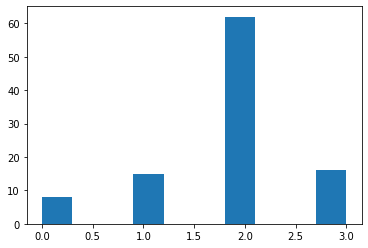

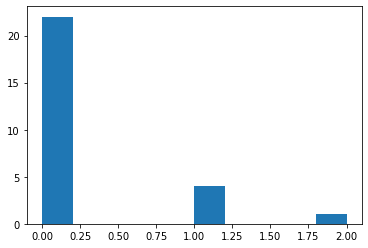

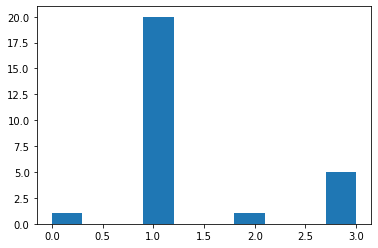

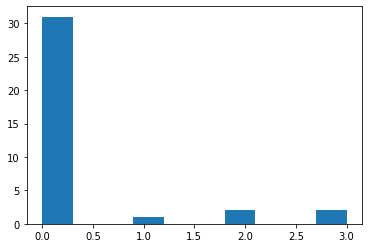

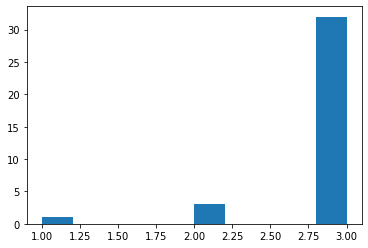

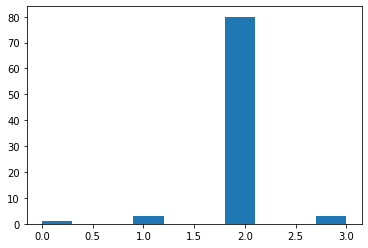

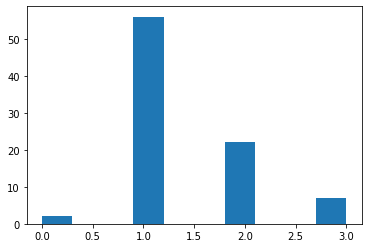

In [0]:
# Iterate the game
episodes =10000
a1_talk = []
a1_act = []
a2_talk = []
a2_act = []
who_talks_arr = []
inner_speech = []
scores1 = []
scores2 = []
last_action_1 = None
last_action_2 = None


for e in range(episodes):
    score1 = 0
    score2 = 0
    ag1_participate = 1
    ag2_participate = 1
    self_talk = random.random() < 0.5 # inner speach 50% of the time
    
    state1, state2, _, _, who_talks = env.step(0, 0, 0)
    # agent 1 talks
    if who_talks:
        if self_talk and last_action_1:
            state1_2, state1, reward1_2, reward1, who_talks = env.step(last_action_1[0], 4, 0) 
            action1 = agent1.act(state1)
            next_state1_2, next_state1, reward1_2, reward1, who_talks = env.step(last_action_1[1], action1[1], 1)     
            score1 += reward1
            ag2_participate = 0
            
        else:
            action1 = agent1.act(state1)
            state1, state2, reward1, reward2, who_talks = env.step(action1[0], 4, 0)  
            score1 += reward1
            action2 = agent2.act(state2) 
            last_action_1 = action1
        
            # everyone chooses
            next_state1, next_state2, reward1, reward2, who_talks = env.step(action1[1], action2[1], 1)     
            score1 += reward1
            score2 += reward2
    
    else:
        if self_talk and last_action_2:
            state2, state2_2, reward2, reward2_2, who_talks = env.step(4, last_action_2[0], 0) 
            action2 = agent2.act(state2)
            next_state2, next_state2_2, reward2, reward2_2, who_talks = env.step(action2[1], last_action_2[1], 1)     
            score2 += reward2
            ag1_participate = 0
        
        else:
            action2 = agent2.act(state2)
            state1, state2, reward1, reward2, who_talks = env.step(0, action2[0], 0)   
            score2 += reward2
            action1 = agent1.act(state1)
            last_action_2 = action2

        # everyone chooses
            next_state1, next_state2, reward1, reward2, who_talks = env.step(action1[1], action2[1], 1)     
            score1 += reward1
            score2 += reward2
    if ag2_participate:
        agent2.remember(state2, action2, reward2, next_state2)
    if ag1_participate:
        agent1.remember(state1, action1, reward1, next_state1)
        
    #if e > 1000:
    #    if score1 > 0.5: #won the game
    #        agent1.epsilon_min = 0
    #    else:
    #        agent1.epsilon_min = 0.1
    #   if score2 > 0.5: #won the game
    #        agent2.epsilon_min = 0
    #    else:
    #        agent2.epsilon_min = 0.1
        

    if e > 0 and e % 500 == 0:
        print("episode: {}/{}, score1: {}, score2: {}"
                  .format(e, episodes, score1, score2))
        scores1_arr = np.array(scores1[e-500:e])
        a1_talk_arr = np.array(a1_talk[e-500:e])
        a1_act_arr = np.array(a1_act[e-500:e])
        a2_talk_arr = np.array(a2_talk[e-500:e])
        a2_act_arr = np.array(a2_act[e-500:e])
        who_talks_arr_2 = np.array(who_talks_arr[e-500:e])
        plt.figure()
        plt.figure()
        plt.hist(a1_act_arr)
        plt.figure()
        plt.hist(a1_talk_arr[who_talks_arr_2==1])
        plt.figure()
        plt.hist(a1_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 0])
        plt.figure()
        plt.hist(a2_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 0])
        plt.figure()
        plt.hist(a1_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 1])
        plt.figure()
        plt.hist(a2_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 1])
        plt.figure()
        plt.hist(a1_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 2])
        plt.figure()
        plt.hist(a2_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 2])
        plt.figure()
        plt.hist(a1_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 3])
        plt.figure()
        plt.hist(a2_act_arr[who_talks_arr_2==1][a1_talk_arr[who_talks_arr_2==1] == 3])

    if len(agent1.memory) > 10 and len(agent2.memory) > 10: 
        #if wins/loses < np.random.uniform(0,2):   
        agent1.replay(10)
        agent2.replay(10)
    
    inner_speech.append(self_talk)
    a1_talk.append(action1[0])
    a1_act.append(action1[1])
    a2_talk.append(action2[0])
    a2_act.append(action2[1])
    who_talks_arr.append(who_talks)
    scores1.append(score1)
    scores2.append(score2)

(array([2., 0., 0., 0., 0., 1., 0., 0., 0., 2.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <a list of 10 Patch objects>)

<Figure size 432x288 with 0 Axes>

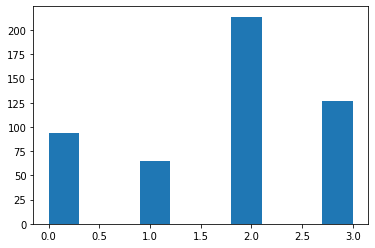

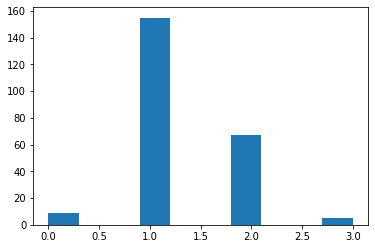

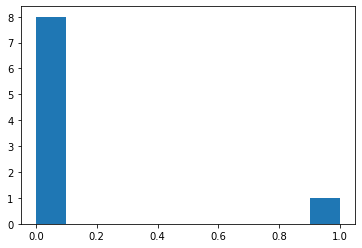

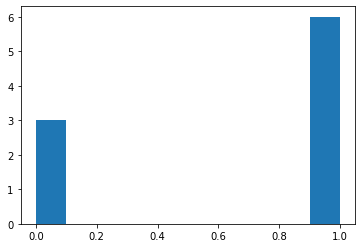

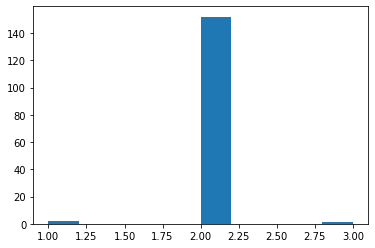

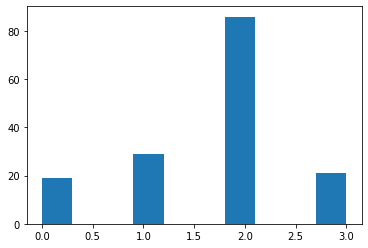

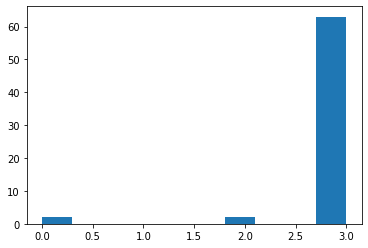

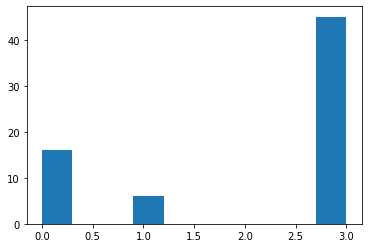

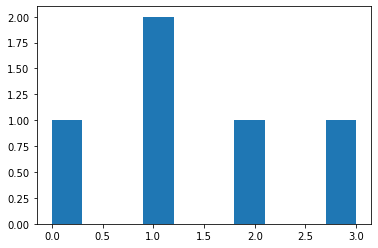

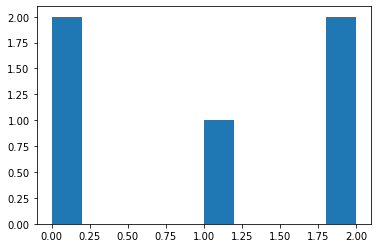

In [0]:
plt.figure()
plt.figure()
plt.hist(a2_act_arr[-1000:])
plt.figure()
plt.hist(a2_talk_arr[-1000:][who_talks_arr_2==0])
plt.figure()
plt.hist(a2_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 0])
plt.figure()
plt.hist(a1_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 0])
plt.figure()
plt.hist(a2_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 1])
plt.figure()
plt.hist(a1_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 1])
plt.figure()
plt.hist(a2_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 2])
plt.figure()
plt.hist(a1_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 2])
plt.figure()
plt.hist(a2_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 3])
plt.figure()
plt.hist(a1_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 3])

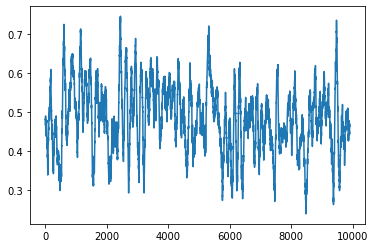

In [0]:
plt.plot(np.convolve(scores2, np.ones((100,))/100, mode='valid'))

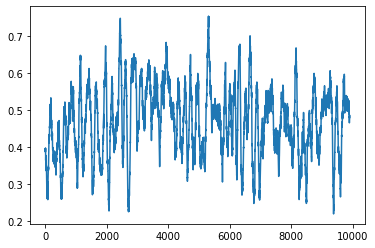

In [0]:
plt.plot(np.convolve(scores1, np.ones((100,))/100, mode='valid'))

## Many (>2) agents

In [10]:
class Two_Roles_Game_Many_Agents():

    def __init__(
        self, num_choices, winning_reward, mean_sample, talking_action_size, num_agents, punishment_weight = 2):
        self.num_choices = num_choices
        self.talking_action_size = talking_action_size
        self.winning_reward = winning_reward
        self.mean_sample = mean_sample
        previous_actions = []
        for i in range(num_agents):
            previous_actions.append(collections.deque(maxlen=mean_sample)) # for mean calculations
        self.previous_actions = previous_actions
        self.mean_punishment_weight = punishment_weight
        self.who_talks = int(random.random()>0.5) # needs to be updated after each game
                
    def step(self, ag1_action, ag2_action, choose, sample, reward1 = 0, reward2 = 0): #choose true or false
        #talker_input = np.zeros((self.talking_action_size+self.talking_action_size+1,)) # no noise
        #talker_input[1:self.talking_action_size+1] = np.random.random((self.talking_action_size,)) #UNIFORM/bimodal NOISE + signal for the game role
        talker_input = np.random.random((self.talking_action_size+1,)) #UNIFORM/bimodal NOISE + signal for the game role
        talker_input[0] = 1 # indicates that needs to talk
        #hearer_input = np.zeros((self.talking_action_size+self.talking_action_size+1,)) # no noise
        hearer_input = np.zeros((self.talking_action_size+1,))
        
        if choose: # step of choice
            self.previous_actions[sample[0]].append(ag1_action)
            self.previous_actions[sample[1]].append(ag2_action)
            a1_rew = 0
            a2_rew = 0
            
            if len(self.previous_actions[sample[0]]) > self.mean_sample-1 and len(self.previous_actions[sample[1]]) > self.mean_sample-1:
                a1_rew = ((1/self.num_choices) - self.previous_actions[sample[0]].count(ag1_action)/self.mean_sample) * self.mean_punishment_weight
                a2_rew = ((1/self.num_choices) - self.previous_actions[sample[1]].count(ag2_action)/self.mean_sample) * self.mean_punishment_weight
                if a1_rew>0:
                  a1_rew = 0
                if a2_rew>0:
                  a2_rew = 0

            if ag2_action == ag1_action: 
                reward1 = self.winning_reward + a1_rew
                reward2 = self.winning_reward + a2_rew
                
            else:
                reward1 = 0 #-1
                reward2 = 0 #-1
                                    
        else:       
            talker_action = ag1_action # first talks all the time
            hearer_input[talker_action+1] = 1
            
        
        return(talker_input, hearer_input, reward1, reward2)


In [11]:
num_choices = 4
num_talking_symbols = 4
winning_reward = 1
mean_sample = 100
punishment_weight = 3
num_agents = 2

agents = []
talks = []
acts = []
scores = []
samples = []
for i in range(num_agents):
    x = DQNAgent_student_teacher(num_talking_symbols, num_choices)
    agents.append(x)
    talks.append([])
    acts.append([])
    scores.append([])

In [13]:
env = Two_Roles_Game_Many_Agents(num_choices, winning_reward, mean_sample, num_talking_symbols, num_agents, punishment_weight) 

In [14]:
talks = []
acts = []
scores = []
samples = []
talks.append([])
acts.append([])
scores.append([])
talks.append([])
acts.append([])
scores.append([])

In [0]:
# Iterate the game
episodes = 30000

for e in range(episodes):
    my_sample = random.choices(range(num_agents), k=2) #random.sample(range(num_agents), 2) -> no replacement - no self-talks
    agent1 = agents[my_sample[0]]
    agent2 = agents[my_sample[1]]
    score1 = 0
    score2 = 0
    
    state1, state2, _, _ = env.step(0, 0, 0, my_sample) # 4 - doing nothing 

    # agent 1 talks
    action1 = agent1.act(state1)
    
    state1, state2, reward1, reward2 = env.step(action1[0], 0, 0, my_sample)     
    score1 += reward1
    
    action2 = agent2.act(state2)
    
    # everyone chooses
    next_state1, next_state2, reward1, reward2 = env.step(action1[1], action2[1], 1, my_sample)     
        
    score1 += reward1
    score2 += reward2
    
    agents[my_sample[1]].remember(state2, action2, reward2, next_state2)
    agents[my_sample[0]].remember(state1, action1, reward1, next_state1)
    
    if e %100 == 0:
        print("episode: {}/{}, score1: {}, score2: {}"
                      .format(e, episodes, score1, score2))
        
    if len(agent1.memory) > 10 and len(agent2.memory) > 10: 
        agents[my_sample[0]].replay(10)
        agents[my_sample[1]].replay(10)
    
    talks[my_sample[0]].append(action1[0])
    talks[my_sample[1]].append(action2[0])
    acts[my_sample[0]].append(action1[1])
    acts[my_sample[1]].append(action2[1])
    scores[my_sample[0]].append(score1)
    scores[my_sample[1]].append(score2)
    samples.append(my_sample)

episode: 0/30000, score1: -0.10999999999999988, score2: -0.10999999999999988
episode: 100/30000, score1: 0.58, score2: 1.24
episode: 200/30000, score1: 0.66, score2: -0.29999999999999993
episode: 300/30000, score1: 0.18999999999999995, score2: 0.18999999999999995
episode: 400/30000, score1: 0.58, score2: 0.58
episode: 500/30000, score1: 1.0, score2: 1.0
episode: 600/30000, score1: -0.26000000000000023, score2: -0.53
episode: 700/30000, score1: -0.4099999999999999, score2: -0.4099999999999999
episode: 800/30000, score1: -0.020000000000000018, score2: -0.14000000000000012
episode: 900/30000, score1: 1.12, score2: 1.12
episode: 1000/30000, score1: 0.3699999999999999, score2: 0.3699999999999999
episode: 1100/30000, score1: 0.63, score2: -1.0499999999999998
episode: 1200/30000, score1: 0.48, score2: 0.32999999999999996
episode: 1300/30000, score1: 0.7000000000000001, score2: 0.7000000000000001
episode: 1400/30000, score1: 0.5499999999999999, score2: 0.5499999999999999
episode: 1500/30000, s

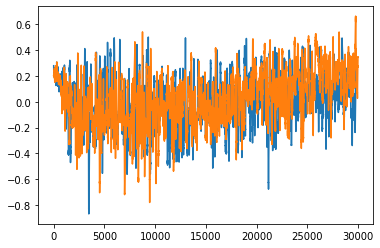

In [0]:
for i in range(num_agents):
    plt.plot(np.convolve(scores[i], np.ones((100,))/100, mode='valid'))

In [0]:
talks[1] = np.array(talks[1])
acts[1] = np.array(acts[1])
scores[1] = np.array(scores[1])
talks[0] = np.array(talks[0])
acts[0] = np.array(acts[0])
scores[0] = np.array(scores[0])

/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


(array([ 64.,   0.,   0., 344.,   0.,   0.,   9.,   0.,   0.,  66.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <a list of 10 Patch objects>)

<Figure size 432x288 with 0 Axes>

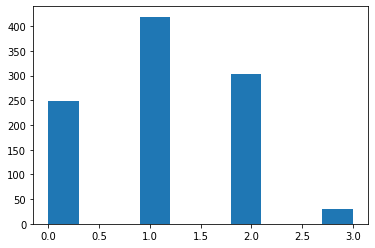

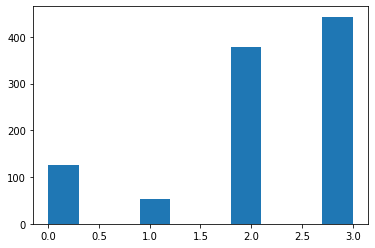

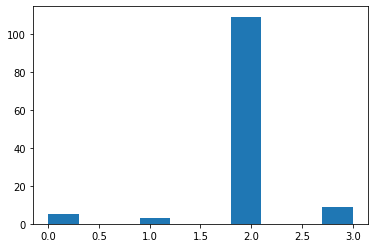

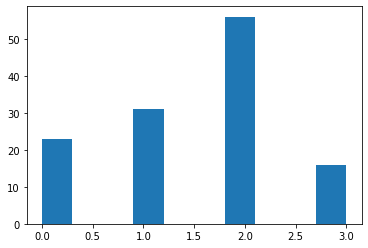

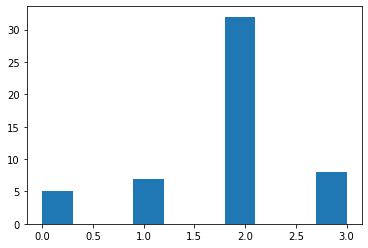

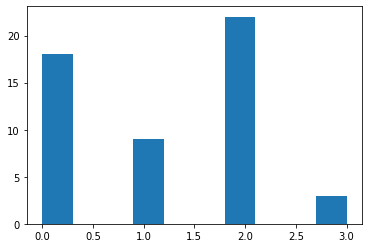

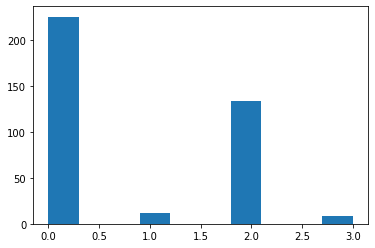

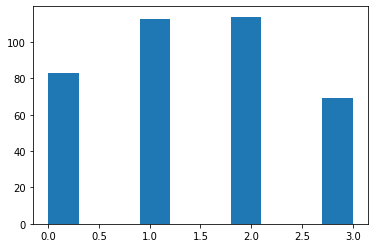

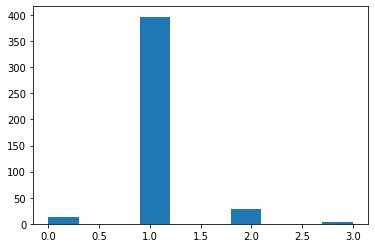

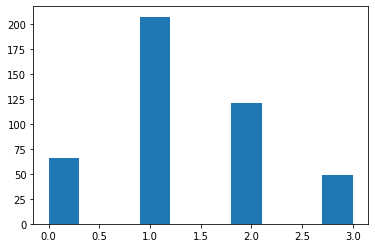

<Figure size 432x288 with 0 Axes>

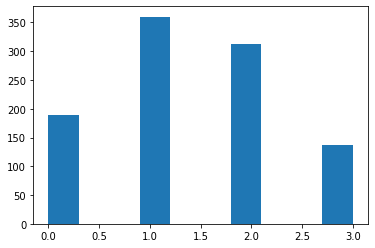

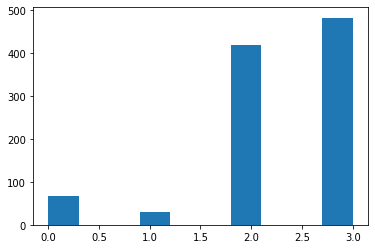

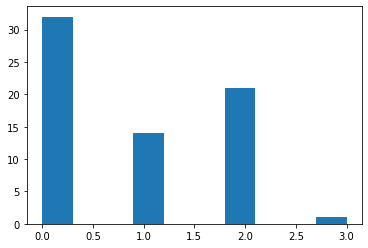

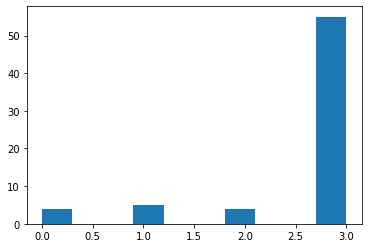

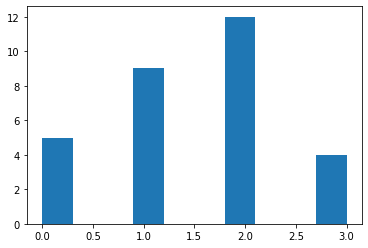

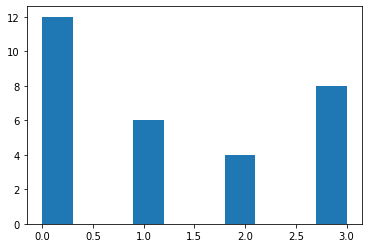

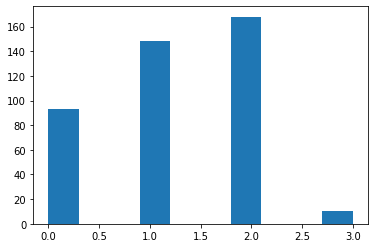

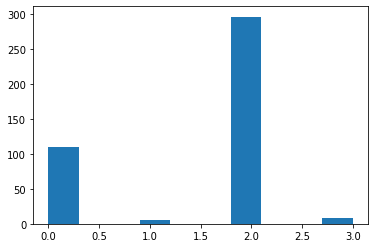

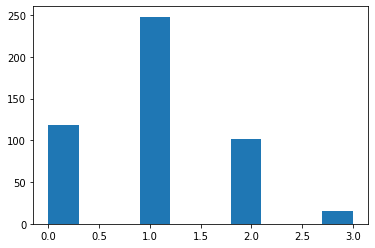

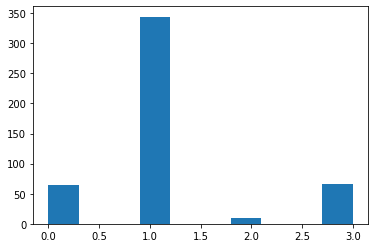

In [0]:
plt.figure()
plt.figure()
plt.hist(acts[0][-1000:])
plt.figure()
plt.hist(talks[0][-1000:])
plt.figure()
plt.hist(acts[0][-1000:][talks[0][-1000:] == 0])
plt.figure()
plt.hist(acts[1][-1000:][talks[0][-1000:] == 0])
plt.figure()
plt.hist(acts[0][-1000:][talks[0][-1000:] == 1])
plt.figure()
plt.hist(acts[1][-1000:][talks[0][-1000:] == 1])
plt.figure()
plt.hist(acts[0][-1000:][talks[0][-1000:] == 2])
plt.figure()
plt.hist(acts[1][-1000:][talks[0][-1000:] == 2])
plt.figure()
plt.hist(acts[0][-1000:][talks[0][-1000:] == 3])
plt.figure()
plt.hist(acts[1][-1000:][talks[0][-1000:] == 3])
plt.figure()

plt.figure()
plt.hist(acts[1][-1000:])
plt.figure()
plt.hist(talks[1][-1000:])
plt.figure()
plt.hist(acts[0][-1000:][talks[1][-1000:] == 0])
plt.figure()
plt.hist(acts[1][-1000:][talks[1][-1000:] == 0])
plt.figure()
plt.hist(acts[0][-1000:][talks[1][-1000:] == 1])
plt.figure()
plt.hist(acts[1][-1000:][talks[1][-1000:] == 1])
plt.figure()
plt.hist(acts[0][-1000:][talks[1][-1000:] == 2])
plt.figure()
plt.hist(acts[1][-1000:][talks[1][-1000:] == 2])
plt.figure()
plt.hist(acts[0][-1000:][talks[1][-1000:] == 3])
plt.figure()
plt.hist(acts[1][-1000:][talks[1][-1000:] == 3])

### Test different numbers of agents

In [195]:
class Two_Roles_Game_Many_Agents():

    def __init__(
        self, num_choices, winning_reward, mean_sample, talking_action_size, num_agents, mean_punishment_weight_talk, punishment_weight):
        self.num_choices = num_choices
        self.talking_action_size = talking_action_size
        self.winning_reward = winning_reward
        self.mean_sample = mean_sample
        previous_actions = []
        previous_talks = []
        self.mean_punishment_weight_talk = mean_punishment_weight_talk
        for i in range(num_agents):
            previous_actions.append(collections.deque(maxlen=mean_sample)) # for mean calculations
        for i in range(num_agents):
            previous_talks.append(collections.deque(maxlen=mean_sample))
        self.previous_talks = previous_talks
        self.previous_actions = previous_actions
        self.mean_punishment_weight = punishment_weight
        self.who_talks = int(random.random()>0.5) # needs to be updated after each game
                
    def step(self, ag1_action, ag2_action, choose, sample, reward1 = 0, reward2 = 0): #choose true or false
        #talker_input = np.zeros((self.talking_action_size+self.talking_action_size+1,)) # no noise
        #talker_input[1:self.talking_action_size+1] = np.random.random((self.talking_action_size,)) #UNIFORM/bimodal NOISE + signal for the game role
        talker_input = np.random.random((self.talking_action_size+self.num_choices+1,)) #UNIFORM/bimodal NOISE + signal for the game role
        talker_input[0] = 1 # indicates that needs to talk
        #hearer_input = np.zeros((self.talking_action_size+self.talking_action_size+1,)) # no noise
        hearer_input = np.zeros((self.talking_action_size+self.num_choices+1,))
        for i in range(self.num_choices):
            talker_input[self.talking_action_size+1+i] = self.previous_actions[sample[0]].count(i)
            hearer_input[self.talking_action_size+1+i] = self.previous_actions[sample[1]].count(i)
        
        if choose: # step of choice
            self.previous_actions[sample[0]].append(ag1_action)
            self.previous_actions[sample[1]].append(ag2_action)
            a1_rew = 0
            a2_rew = 0
            
            if len(self.previous_actions[sample[0]]) > self.mean_sample-1 and len(self.previous_actions[sample[1]]) > self.mean_sample-1:
                a1_rew = ((1/self.num_choices) - self.previous_actions[sample[0]].count(ag1_action)/self.mean_sample) * self.mean_punishment_weight
                a2_rew = ((1/self.num_choices) - self.previous_actions[sample[1]].count(ag2_action)/self.mean_sample) * self.mean_punishment_weight
                #if a1_rew>0:
                #    a1_rew = 0
                #if a2_rew>0:
                #    a2_rew = 0

            if ag2_action == ag1_action: 
                reward1 = self.winning_reward + a1_rew
                reward2 = self.winning_reward + a2_rew
                
            else:
                reward1 = 0 #-1
                reward2 = 0 #-1
                                    
        else:       
            talker_action = ag1_action # first talks all the time
            self.previous_talks[sample[0]].append(ag1_action)
            hearer_input[talker_action+1] = 1
            if len(self.previous_talks[sample[0]]) > self.mean_sample-1:
                reward1 = ((1/self.talking_action_size) - self.previous_talks[sample[0]].count(ag1_action)/self.mean_sample) * self.mean_punishment_weight_talk
            
        
        return(talker_input, hearer_input, reward1, reward2)


In [218]:
class DQNAgent_student_teacher:
    def __init__(self, talking_action_size, choices, beta, memory_size = 11): 
        self.memory = collections.deque(maxlen=memory_size)
        self.gamma = 0.95    # discount rate
        self.epsilon = 1.0  # exploration rate
        self.epsilon_min = 0.03
        self.epsilon_decay = 0.999
        self.beta_1 = beta
        self.learning_rate_bad = 0.0001
        self.learning_rate_good = 0.0001
        self.talking_action_size = talking_action_size
        self.choices = choices
        self.model = self._build_model_student_teacher()
 
 
    def _build_model_student_teacher(self):
        # Neural Net for Deep-Q learning Model
        
        model = Sequential()
        #model.add(Dense(25, input_dim=self.talking_action_size + self.talking_action_size +self.talking_action_size+ 1, activation='relu')) # one input - the game role
        model.add(Dense(25, input_dim=self.talking_action_size + self.choices + self.talking_action_size+ 1, activation='relu')) # one input - the game role
        #model.add(Dense(15, activation='relu'))
        model.add(Dense(15, activation='relu'))
 
        model.add(Dense(self.choices, activation='linear'))
        model.compile(loss='mse',
                      optimizer=Adam(lr=self.learning_rate_bad, beta_1=self.beta_1, beta_2=0.99))
        return model
       
   
    def remember(self, state, action, reward, next_state):
        self.memory.append((state, action, reward, next_state))
                           
    def act(self, state):
        if np.random.rand() <= self.epsilon:
            return [random.randrange(self.talking_action_size), random.randrange(self.choices)]
 
        
        max_q = -float("infinity")
        max_talk = None
        max_action = None
 
        for i in range(self.talking_action_size):
            talking = np.zeros(self.talking_action_size)
            talking[i] = 1
 
            state_cur = np.expand_dims(np.hstack([state, talking]), axis=0)
            act_values = self.model.predict(state_cur, batch_size=1)
 
            cur_max = np.max(act_values)
           
            if cur_max > max_q:
 
              max_q = cur_max
              max_action = np.argmax(act_values[0])
              max_talk = i
 
            assert max_talk is not None
            assert max_action is not None
 
        return [max_talk, max_action]
                           
    def replay(self, batch_size):
        for i in self.memory:
            minibatch = random.sample(self.memory, batch_size)
        my_x = []
        my_y = []
        for state, action, reward, next_state in minibatch:
            next_state = np.expand_dims(next_state, axis=0)
            #state = np.expand_dims(state, axis=0)
            target = reward
            one_hot_talk = np.zeros(self.talking_action_size)
            one_hot_talk[action[0]] = 1
            cur_state = np.expand_dims(np.hstack([state, one_hot_talk]), axis=0)
            target_f = self.model.predict(cur_state, batch_size=1)
            target_f[0][action[1]] = target # choose
            cur_state = np.squeeze(cur_state)
            target_f = np.squeeze(target_f)
            my_x.append(cur_state)
            my_y.append(target_f)
        
        my_x = np.array(my_x)
        my_y = np.array(my_y)
        self.model.train_on_batch(my_x, my_y)
 
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

In [220]:
def play_many_games(num_agents, num_episodes, inner_speech, learning_rate, punishment_weight, punishment_talk, agents_memory, replay, beta_1):
    num_choices = 4
    num_talking_symbols = 4
    winning_reward = 1 # CHANGE
    mean_sample = 100
    punishment_weight = punishment_weight
    num_agents = num_agents
    
    env = Two_Roles_Game_Many_Agents(num_choices, winning_reward, mean_sample, num_talking_symbols, num_agents, punishment_talk, punishment_weight) 

    agents = []
    talks = []
    acts = []
    scores = []
    samples = []
    for i in range(num_agents):
        x = DQNAgent_student_teacher(num_talking_symbols, num_choices, beta_1, agents_memory)
        x.learning_rate_bad = learning_rate
        agents.append(x)
        talks.append([])
        acts.append([])
        scores.append([])
        
        # Iterate the game
    episodes = num_episodes

    for e in range(episodes):
        if inner_speech:
            my_sample = random.choices(range(num_agents), k=2) # with replacement
        else:    
            my_sample = random.sample(range(num_agents), 2) #no replacement - no self-talks
        if my_sample[0] == my_sample[1]: # make inner speech less frequent
            if random.random() < 0.3:
                my_sample = random.choices(range(num_agents), k=2) 
        agent1 = agents[my_sample[0]]
        agent2 = agents[my_sample[1]]
        score1 = 0
        score2 = 0

        state1, state2, _, _ = env.step(0, 0, 0, my_sample) # 4 - doing nothing 

        # agent 1 talks
        action1 = agent1.act(state1)

        state1, state2, reward1, reward2 = env.step(action1[0], 0, 0, my_sample)     
        score1 += reward1

        action2 = agent2.act(state2)

        # everyone chooses
        next_state1, next_state2, reward1, reward2 = env.step(action1[1], action2[1], 1, my_sample)     

        score1 += reward1
        score2 += reward2

        agents[my_sample[1]].remember(state2, action2, reward2, next_state2)
        agents[my_sample[0]].remember(state1, action1, reward1, next_state1)

        if e %100 == 0:
            print("episode: {}/{}, score1: {}, score2: {}"
                          .format(e, episodes, score1, score2))

        if len(agent1.memory) >= replay and len(agent2.memory) >= replay: 
            agents[my_sample[0]].replay(replay)
            agents[my_sample[1]].replay(replay)
        else:
            print("replay more than memory")

        talks[my_sample[0]].append(action1[0])
        talks[my_sample[1]].append(action2[0])
        acts[my_sample[0]].append(action1[1])
        acts[my_sample[1]].append(action2[1])
        scores[my_sample[0]].append(score1)
        scores[my_sample[1]].append(score2)
        samples.append(my_sample)
        
    return [agents, talks, acts, scores, samples]

In [232]:
d = play_many_games(2, 50000, 1, 0.0001, 2, 0, 5, 5, 0.9)

episode: 0/50000, score1: 1, score2: 1
replay more than memory
replay more than memory
replay more than memory
replay more than memory
replay more than memory
episode: 100/50000, score1: 0.0, score2: 0
episode: 200/50000, score1: 0.0, score2: 0
episode: 300/50000, score1: 0.0, score2: 0
episode: 400/50000, score1: 0.0, score2: 0
episode: 500/50000, score1: 0.0, score2: 0
episode: 600/50000, score1: 0.0, score2: 0
episode: 700/50000, score1: 0.98, score2: 0.98
episode: 800/50000, score1: 0.0, score2: 0
episode: 900/50000, score1: 0.0, score2: 0
episode: 1000/50000, score1: 0.56, score2: 0.7
episode: 1100/50000, score1: 0.0, score2: 0
episode: 1200/50000, score1: 0.92, score2: 1.2
episode: 1300/50000, score1: 0.26, score2: 0.26
episode: 1400/50000, score1: 0.94, score2: 0.94
episode: 1500/50000, score1: 1.04, score2: 1.04
episode: 1600/50000, score1: 0.48, score2: 1.02
episode: 1700/50000, score1: 0.0, score2: 0
episode: 1800/50000, score1: 0.0, score2: 0
episode: 1900/50000, score1: 0.0

/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


(array([4., 0., 0., 2., 0., 0., 1., 0., 0., 4.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <a list of 10 Patch objects>)

<Figure size 432x288 with 0 Axes>

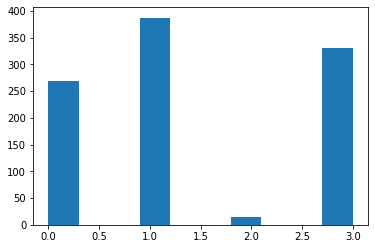

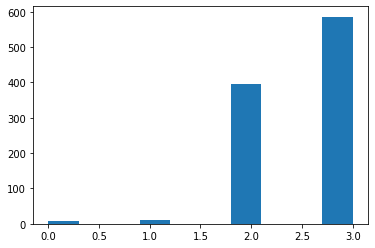

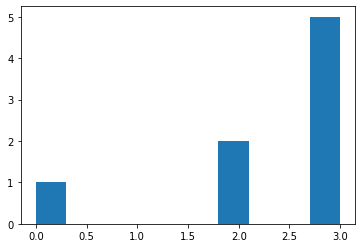

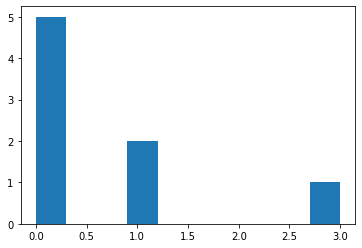

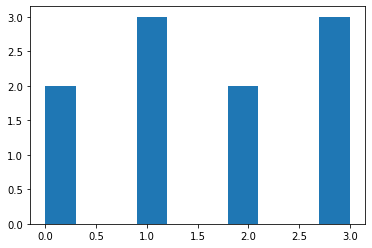

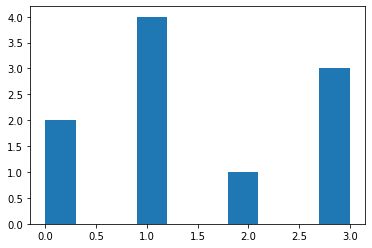

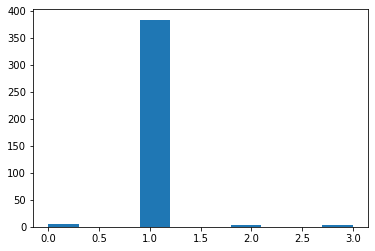

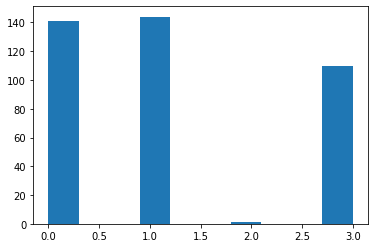

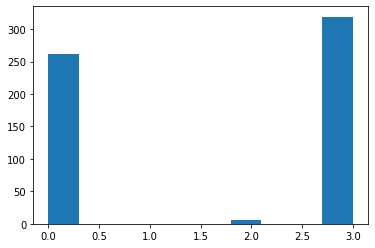

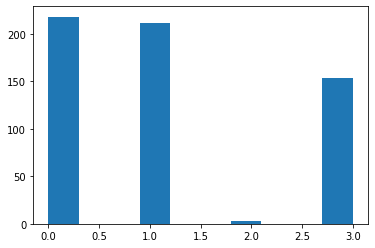

<Figure size 432x288 with 0 Axes>

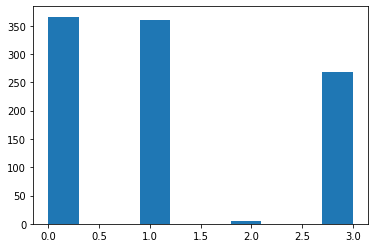

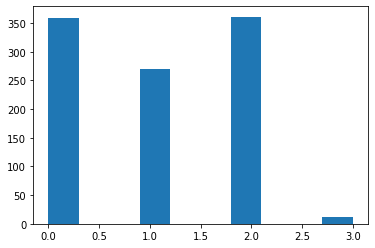

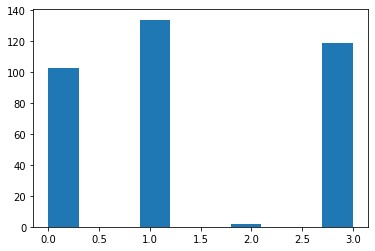

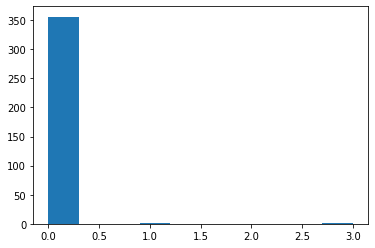

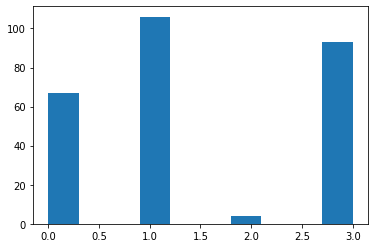

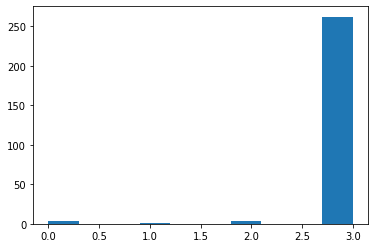

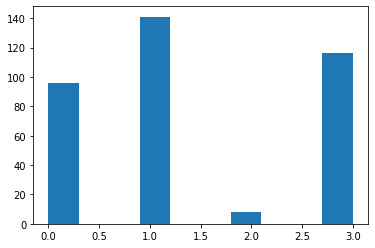

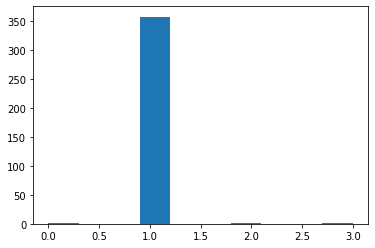

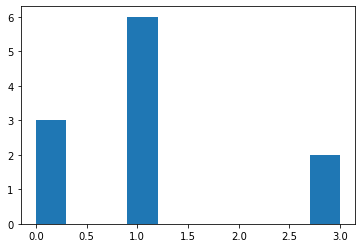

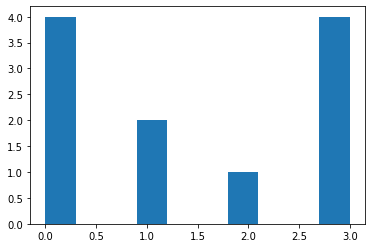

In [233]:
games = d
for i in range(len(games)):
    for j in range(len(games[i])):
        games[i][j] = np.array(games[i][j])
    
plt.figure()
plt.figure()
plt.hist(games[2][0][-1000:])
plt.figure()
plt.hist(games[1][0][-1000:])
plt.figure()
plt.hist(games[2][0][-1000:][games[1][0][-1000:] == 0])
plt.figure()
plt.hist(games[2][1][-1000:][games[1][0][-1000:] == 0])
plt.figure()
plt.hist(games[2][0][-1000:][games[1][0][-1000:] == 1])
plt.figure()
plt.hist(games[2][1][-1000:][games[1][0][-1000:] == 1])
plt.figure()
plt.hist(games[2][0][-1000:][games[1][0][-1000:] == 2])
plt.figure()
plt.hist(games[2][1][-1000:][games[1][0][-1000:] == 2])
plt.figure()
plt.hist(games[2][0][-1000:][games[1][0][-1000:] == 3])
plt.figure()
plt.hist(games[2][1][-1000:][games[1][0][-1000:] == 3])

plt.figure()
plt.figure()
plt.hist(games[2][1][-1000:])
plt.figure()
plt.hist(games[1][1][-1000:])
plt.figure()
plt.hist(games[2][0][-1000:][games[1][1][-1000:] == 0])
plt.figure()
plt.hist(games[2][1][-1000:][games[1][1][-1000:] == 0])
plt.figure()
plt.hist(games[2][0][-1000:][games[1][1][-1000:] == 1])
plt.figure()
plt.hist(games[2][1][-1000:][games[1][1][-1000:] == 1])
plt.figure()
plt.hist(games[2][0][-1000:][games[1][1][-1000:] == 2])
plt.figure()
plt.hist(games[2][1][-1000:][games[1][1][-1000:] == 2])
plt.figure()
plt.hist(games[2][0][-1000:][games[1][1][-1000:] == 3])
plt.figure()
plt.hist(games[2][1][-1000:][games[1][1][-1000:] == 3])

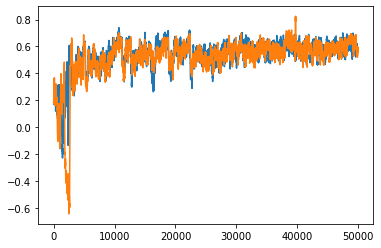

In [231]:
plt.plot(np.convolve(games[3][0], np.ones((100,))/100, mode='valid'))
plt.plot(np.convolve(games[3][1], np.ones((100,))/100, mode='valid'))

punishment_weight: 3, memory: 1, replay = 1, beta = 0.1
episode: 0/50000, score1: 0, score2: 0
episode: 100/50000, score1: 0.94, score2: 1
episode: 200/50000, score1: 0.7000000000000001, score2: 0.97
episode: 300/50000, score1: 0, score2: 0
episode: 400/50000, score1: 0, score2: 0
episode: 500/50000, score1: 0.25, score2: 0.09999999999999987
episode: 600/50000, score1: 0.1299999999999999, score2: 0.15999999999999992
episode: 700/50000, score1: 0, score2: 0
episode: 800/50000, score1: 0, score2: 0
episode: 900/50000, score1: 0.97, score2: 1
episode: 1000/50000, score1: 0.64, score2: 1
episode: 1100/50000, score1: 0.1299999999999999, score2: 0.21999999999999997
episode: 1200/50000, score1: 0, score2: 0
episode: 1300/50000, score1: 0, score2: 0
episode: 1400/50000, score1: 0, score2: 0
episode: 1500/50000, score1: 0, score2: 0
episode: 1600/50000, score1: 0, score2: 0
episode: 1700/50000, score1: 0.94, score2: -0.5
episode: 1800/50000, score1: 0, score2: 0
episode: 1900/50000, score1: 0, 

/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


punishment_weight: 3, memory: 10, replay = 5, beta = 0.3
episode: 0/50000, score1: 0, score2: 0
replay more than memory
replay more than memory
replay more than memory
replay more than memory
episode: 100/50000, score1: 0, score2: 0
episode: 200/50000, score1: 0, score2: 0
episode: 300/50000, score1: 0, score2: 0
episode: 400/50000, score1: 0, score2: 0
episode: 500/50000, score1: 0.52, score2: 0.3400000000000001
episode: 600/50000, score1: 0.06999999999999984, score2: 0.09999999999999987
episode: 700/50000, score1: 1, score2: 1
episode: 800/50000, score1: 0, score2: 0
episode: 900/50000, score1: 0, score2: 0
episode: 1000/50000, score1: 0, score2: 0
episode: 1100/50000, score1: 0.3699999999999999, score2: 0.21999999999999997
episode: 1200/50000, score1: 0, score2: 0
episode: 1300/50000, score1: 0.01000000000000012, score2: 0.25
episode: 1400/50000, score1: 0.97, score2: 1
episode: 1500/50000, score1: 0, score2: 0
episode: 1600/50000, score1: 0, score2: 0
episode: 1700/50000, score1: 0

KeyboardInterrupt: 

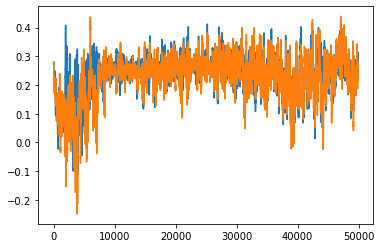

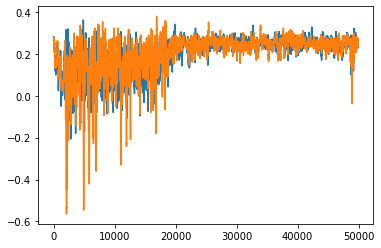

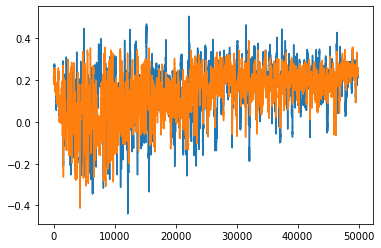

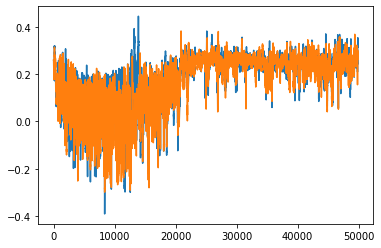

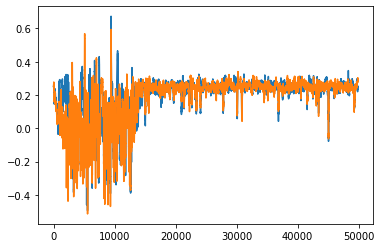

...

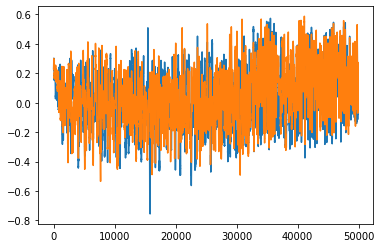

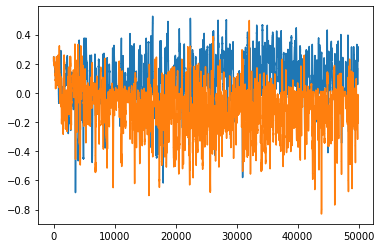

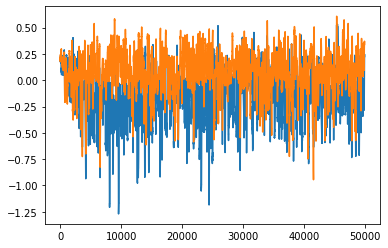

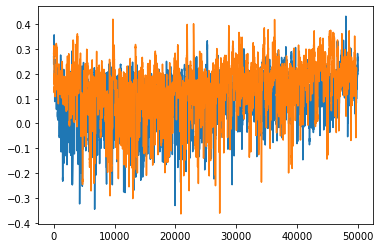

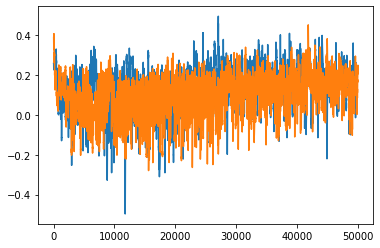

In [19]:
games = []
#lrates = [0.00001,0.0001,0.001,0.01,0.1]
punishment_weight = [3, 4, 4.5, 5.5]
beta = [0.1, 0.3, 0.5, 0.7, 0.9]
memory_replay = [[1,2,5,5,10,10],[1,2,1,5,5,10]]
inner_speech_conditions = [0,1]
#for lr in lrates:
for inn in inner_speech_conditions:
    for punish in punishment_weight:
        for i in range(len(memory_replay[0])):
            for b in beta:
                print("punishment_weight: {}, memory: {}, replay = {}, beta = {}".format(punish, memory_replay[0][i], memory_replay[1][i], b))
                d = play_many_games(2, 50000, inn, 0.0001, punish, memory_replay[0][i], memory_replay[1][i], b)
                games.append(d)
                plt.figure()
                for j in range(2):
                    plt.plot(np.convolve(d[3][j], np.ones((100,))/100, mode='valid'))
                    #plt.title("punishment_weight: {}, memory: {}, replay = {}, beta = {}".format(punish, memory_replay[0][i], memory_replay[1][i], b))
    

In [23]:
saved_games = games

In [33]:
games = saved_games

In [34]:
saved_games[31]

[[<__main__.DQNAgent_student_teacher at 0x67dd24e50>,
 [[2,
   1,
   3,
   1,
   1,
   0,
   1,
   3,
   1,
   3,
   3,
   3,
   0,
   3,
   0,
   0,
   0,
   1,
   1,
   0,
   2,
   0,
   2,
   1,
   3,
   1,
   3,
   3,
   0,
   2,
   1,
   3,
   0,
   3,
   1,
   2,
   0,
   3,
   0,
   1,
   0,
   3,
   3,
   3,
   3,
   0,
   2,
   3,
   3,
   2,
   1,
   1,
   0,
   0,
   1,
   2,
   2,
   0,
   0,
   1,
   0,
   2,
   2,
   3,
   2,
   0,
   3,
   2,
   1,
   2,
   2,
   2,
   0,
   1,
   0,
   2,
   1,
   2,
   1,
   2,
   2,
   2,
   1,
   0,
   3,
   2,
   0,
   0,
   2,
   0,
   0,
   0,
   3,
   1,
   3,
   3,
   3,
   2,
   1,
   3,
   3,
   2,
   2,
   1,
   2,
   3,
   1,
   2,
   1,
   1,
   2,
   1,
   3,
   0,
   1,
   3,
   0,
   3,
   2,
   0,
   3,
   0,
   2,
   3,
   2,
   1,
   1,
   1,
   2,
   3,
   2,
   1,
   2,
   1,
   1,
   3,
   0,
   3,
   2,
   1,
   2,
   0,
   0,
   3,
   0,
   2,
   3,
   2,
   1,
   1,
   3,
   0,
   1,
   3,
   1,
   0,
   1,
   0

In [20]:
punishment_weight = [3, 4, 4.5, 5.5]
beta = [0.1, 0.3, 0.5, 0.7, 0.9]
memory_replay = [[1,2,5,5,10,10],[1,2,1,5,5,10]]
inner_speech_conditions = [0,1]
#for lr in lrates:
#for inn in inner_speech_conditions:
for punish in punishment_weight:
    for i in range(len(memory_replay[0])):
        for b in beta:
            print("punishment_weight: {}, memory: {}, replay = {}, beta = {}".format(punish, memory_replay[0][i], memory_replay[1][i], b))

punishment_weight: 3, memory: 1, replay = 1, beta = 0.1
punishment_weight: 3, memory: 1, replay = 1, beta = 0.3
punishment_weight: 3, memory: 1, replay = 1, beta = 0.5
punishment_weight: 3, memory: 1, replay = 1, beta = 0.7
punishment_weight: 3, memory: 1, replay = 1, beta = 0.9
punishment_weight: 3, memory: 2, replay = 2, beta = 0.1
punishment_weight: 3, memory: 2, replay = 2, beta = 0.3
punishment_weight: 3, memory: 2, replay = 2, beta = 0.5
punishment_weight: 3, memory: 2, replay = 2, beta = 0.7
punishment_weight: 3, memory: 2, replay = 2, beta = 0.9
punishment_weight: 3, memory: 5, replay = 1, beta = 0.1
punishment_weight: 3, memory: 5, replay = 1, beta = 0.3
punishment_weight: 3, memory: 5, replay = 1, beta = 0.5
punishment_weight: 3, memory: 5, replay = 1, beta = 0.7
punishment_weight: 3, memory: 5, replay = 1, beta = 0.9
punishment_weight: 3, memory: 5, replay = 5, beta = 0.1
punishment_weight: 3, memory: 5, replay = 5, beta = 0.3
punishment_weight: 3, memory: 5, replay = 5, bet

/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/marinadubova/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<Figure size 432x288 with 0 Axes>

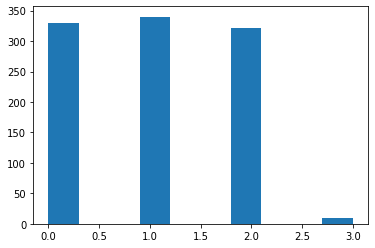

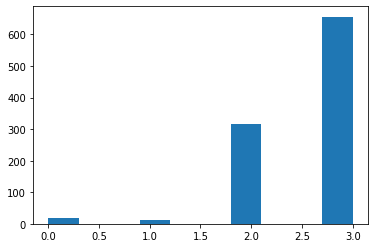

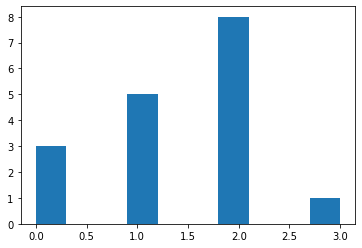

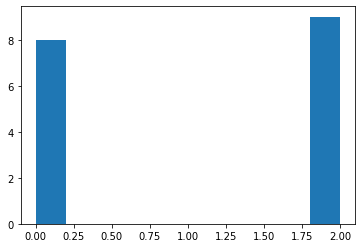

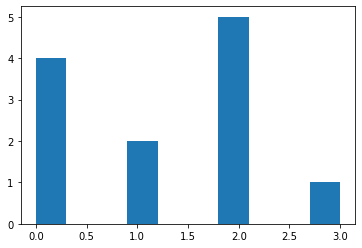

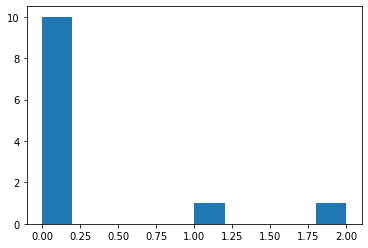

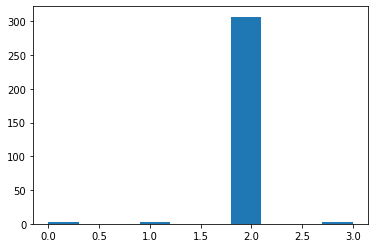

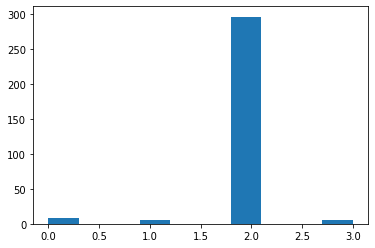

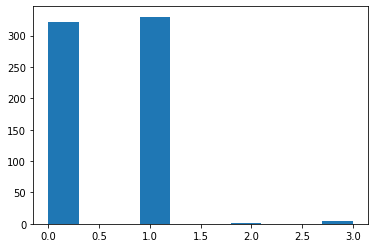

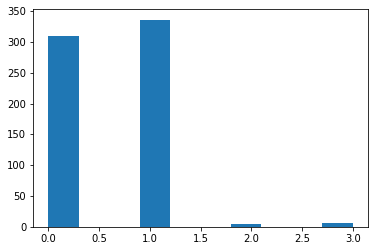

<Figure size 432x288 with 0 Axes>

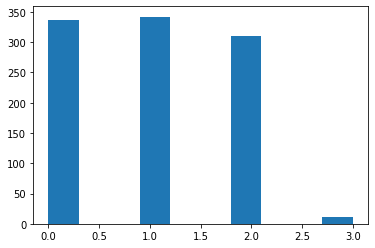

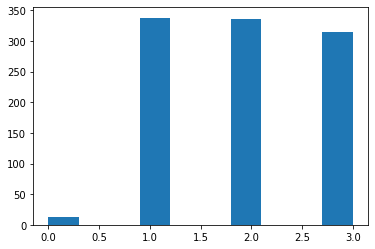

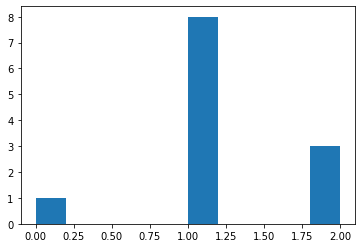

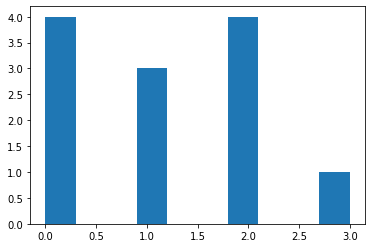

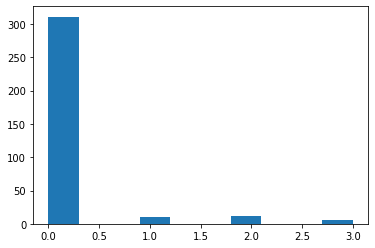

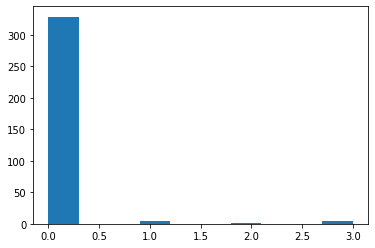

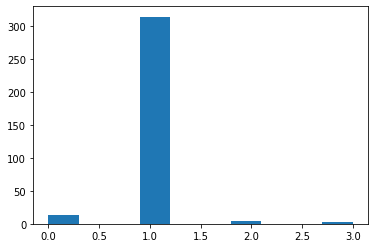

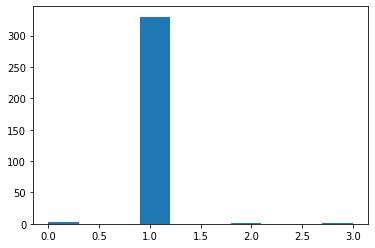

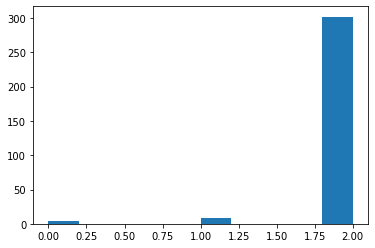

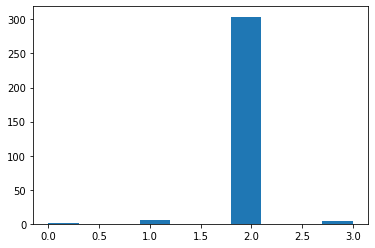

In [35]:
for i in range(len(games)):
    for j in range(len(games[i])):
        for k in range(len(games[i][j])):
            games[i][j][k] = np.array(games[i][j][k])
    
for i in range(31,32):
    plt.figure()
    plt.figure()
    plt.hist(games[i][2][0][-1000:])
    plt.figure()
    plt.hist(games[i][1][0][-1000:])
    plt.figure()
    plt.hist(games[i][2][0][-1000:][games[i][1][0][-1000:] == 0])
    plt.figure()
    plt.hist(games[i][2][1][-1000:][games[i][1][0][-1000:] == 0])
    plt.figure()
    plt.hist(games[i][2][0][-1000:][games[i][1][0][-1000:] == 1])
    plt.figure()
    plt.hist(games[i][2][1][-1000:][games[i][1][0][-1000:] == 1])
    plt.figure()
    plt.hist(games[i][2][0][-1000:][games[i][1][0][-1000:] == 2])
    plt.figure()
    plt.hist(games[i][2][1][-1000:][games[i][1][0][-1000:] == 2])
    plt.figure()
    plt.hist(games[i][2][0][-1000:][games[i][1][0][-1000:] == 3])
    plt.figure()
    plt.hist(games[i][2][1][-1000:][games[i][1][0][-1000:] == 3])

    plt.figure()
    plt.figure()
    plt.hist(games[i][2][1][-1000:])
    plt.figure()
    plt.hist(games[i][1][1][-1000:])
    plt.figure()
    plt.hist(games[i][2][0][-1000:][games[i][1][1][-1000:] == 0])
    plt.figure()
    plt.hist(games[i][2][1][-1000:][games[i][1][1][-1000:] == 0])
    plt.figure()
    plt.hist(games[i][2][0][-1000:][games[i][1][1][-1000:] == 1])
    plt.figure()
    plt.hist(games[i][2][1][-1000:][games[i][1][1][-1000:] == 1])
    plt.figure()
    plt.hist(games[i][2][0][-1000:][games[i][1][1][-1000:] == 2])
    plt.figure()
    plt.hist(games[i][2][1][-1000:][games[i][1][1][-1000:] == 2])
    plt.figure()
    plt.hist(games[i][2][0][-1000:][games[i][1][1][-1000:] == 3])
    plt.figure()
    plt.hist(games[i][2][1][-1000:][games[i][1][1][-1000:] == 3])

In [36]:
plt.plot(np.convolve(games[3][0], np.ones((100,))/100, mode='valid'))
plt.plot(np.convolve(games[3][1], np.ones((100,))/100, mode='valid'))

TypeError: unsupported operand type(s) for *: 'float' and 'DQNAgent_student_teacher'

In [0]:
plt.figure()
plt.figure()
plt.hist(a2_act_arr[-1000:])
plt.figure()
plt.hist(a2_talk_arr[-1000:][who_talks_arr_2==0])
plt.figure()
plt.hist(a2_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 0])
plt.figure()
plt.hist(a1_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 0])
plt.figure()
plt.hist(a2_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 1])
plt.figure()
plt.hist(a1_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 1])
plt.figure()
plt.hist(a2_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 2])
plt.figure()
plt.hist(a1_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 2])
plt.figure()
plt.hist(a2_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 3])
plt.figure()
plt.hist(a1_act_arr[-1000:][who_talks_arr_2==0][a2_talk_arr[who_talks_arr_2==0] == 3])

## Compositionality

In [0]:
class One_Talking_compositionality():

    # Enumeration of possible actions
    class Actions():
        silence = 0
        a = 1
        b = 2
        c = 3
        nothing = 4
        choose_1 = 5
        choose_2 = 6
        choose_3 = 7 #etc
        # choose entity - entity number (the range(num of entities))

    def __init__(
        self, num_ent, winning_reward, talking_reward = 0): #choose true or false

        # Action enumeration for this environment
        #d = {1:"a",2:"b",3:"c"}
        #for i in range(num_ent):
        #    d[i+4] = str(i+1)
        #self.actions = d
        self.num_ent = num_ent
        self.winning_reward = winning_reward
        self.talking_reward = talking_reward
        self.talking_decay = 0.995
        self.actions1 = collections.deque(maxlen=50)
        self.actions2 = collections.deque(maxlen=50)
                
    def step(self, ag1_action, ag2_action, choose, reward1 = 0, reward2 = 0):
        ag1_input = np.array([np.random.random()]) #UNIFORM/bimodal NOISE
        ag2_input = np.random.normal(0,0.01,(4,)) * 0 #talking binary (3) + noise
                
        if choose: # step of choice
            self.actions1.append(ag1_action)
            self.actions2.append(ag2_action)
            a1_rew = 0
            a2_rew = 0
            
            if len(self.actions1) > 49:
                a1_rew = ((1/self.num_ent) - self.actions1.count(ag1_action)/50) * 2
                a2_rew = ((1/self.num_ent) - self.actions2.count(ag2_action)/50) * 2
                
            if ag2_action == ag1_action: 
                reward1 = self.winning_reward + a1_rew
                reward2 = self.winning_reward + a2_rew
                
            else:
                reward1 = a1_rew#-1
                reward2 = a2_rew#-1
                    
        else: # agent 1 talking 
            if ag1_action == 1:
                ag2_input[0] += 1
                reward1 = self.talking_reward # * 0.995
            elif ag1_action == 2:
                ag2_input[1] += 1
                reward1 = self.talking_reward # * 0.995
            elif ag1_action == 3:
                ag2_input[2] += 1
                reward1 = self.talking_reward # * 0.995
        
        return(ag1_input, ag2_input, reward1, reward2)